
**Necessary libraries**

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import mannwhitneyu

from sklearn.preprocessing import LabelEncoder

**Loading Data**

In [ ]:
df=pd.read_csv('/content/NHISDataset.csv')
df


,Gender,Age,AGE65,Education_level,General_Health,Life_Satisfaction,Hypertension_Once,Hypertension_twice,Hypertension_Last_year,Cholesterol,...,Fruit_Period,Leafy_Green,Salad_Period,Salad_Period.1,Potato_Fried_Period,Beans_Period,Vegetable_Period,Pizza_Period,Balance_Meal_Affordability,Balance_Meal_Affordability.1
0,1,85,NaN,4,2,2,1,2.0,NaN,2,...,3,1,3,3,0,2,3,1,3,3
1,1,64,NaN,8,3,2,1,2.0,NaN,1,...,3,5,2,2,2,2,2,3,3,3
2,2,37,NaN,8,3,1,2,NaN,NaN,2,...,2,4,2,2,0,0,2,0,3,3
3,2,72,NaN,5,2,1,1,1.0,2.0,2,...,0,3,2,2,2,2,2,0,3,3
4,2,84,NaN,6,2,2,1,1.0,1.0,2,...,2,1,3,3,0,1,1,0,3,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27646,1,64,NaN,4,3,2,2,NaN,NaN,2,...,2,3,2,2,2,2,2,2,3,3
27647,2,67,NaN,8,2,2,2,NaN,NaN,1,...,1,1,1,1,0,2,2,0,3,3
27648,2,69,NaN,7,1,1,2,NaN,NaN,1,...,3,2,2,2,3,2,1,3,3,3
27649,1,30,NaN,7,2,1,2,NaN,NaN,1,...,1,1,2,2,2,3,2,2,3,3


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27651 entries, 0 to 27650
Data columns (total 54 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Gender                           27651 non-null  int64  
 1   Age                              27651 non-null  int64  
 2   AGE65                            126 non-null    float64
 3   Education_level                  27651 non-null  int64  
 4   General_Health                   27651 non-null  int64  
 5   Life_Satisfaction                27651 non-null  int64  
 6   Hypertension_Once                27651 non-null  int64  
 7   Hypertension_twice               10152 non-null  float64
 8   Hypertension_Last_year           8716 non-null   float64
 9   Cholesterol                      27651 non-null  int64  
 10  Drinking_Status                  27651 non-null  int64  
 11  Cholesterol_year                 8724 non-null   float64
 12  Diabetes_ever_or_b

In [ ]:
df.describe()

,Gender,Age,AGE65,Education_level,General_Health,Life_Satisfaction,Hypertension_Once,Hypertension_twice,Hypertension_Last_year,Cholesterol,...,Fruit_Period,Leafy_Green,Salad_Period,Salad_Period.1,Potato_Fried_Period,Beans_Period,Vegetable_Period,Pizza_Period,Balance_Meal_Affordability,Balance_Meal_Affordability.1
count,27651.000000,27651.000000,126.000000,27651.000000,27651.000000,27651.000000,27651.000000,10152.000000,8716.000000,27651.000000,...,27651.000000,27651.000000,27651.000000,27651.000000,27651.000000,27651.000000,27651.000000,27651.000000,27651.000000,27651.000000
mean,1.545080,53.050920,1.690476,6.443528,2.440273,1.626126,1.642364,1.159673,1.211680,1.705255,...,1.912336,42.445120,2.062204,2.062204,2.193664,2.105747,1.962171,2.451665,3.090919,3.090919
std,0.503103,18.539785,1.530826,7.186305,1.058337,0.695293,0.542125,0.527275,0.641145,0.603181,...,1.487640,193.261714,1.479248,1.479248,1.608139,1.685925,1.476573,1.592888,1.153302,1.153302
min,1.000000,18.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000
25%,1.000000,37.000000,1.000000,4.000000,2.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,2.000000,1.000000,1.000000,2.000000,3.000000,3.000000
50%,2.000000,54.000000,1.000000,6.000000,2.000000,2.000000,2.000000,1.000000,1.000000,2.000000,...,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,3.000000,3.000000,3.000000
75%,2.000000,68.000000,2.000000,8.000000,3.000000,2.000000,2.000000,1.000000,1.000000,2.000000,...,2.000000,4.000000,2.000000,2.000000,3.000000,3.000000,2.000000,3.000000,3.000000,3.000000
max,9.000000,99.000000,9.000000,99.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,...,9.000000,999.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000


# **Data Cleaning and preprocessing**

In [ ]:
df.isnull().sum()

Gender                                 0
Age                                    0
AGE65                              27525
Education_level                        0
General_Health                         0
Life_Satisfaction                      0
Hypertension_Once                      0
Hypertension_twice                 17499
Hypertension_Last_year             18935
Cholesterol                            0
Drinking_Status                        0
Cholesterol_year                   18927
Diabetes_ever_or_borderline            0
Gestational_Diabetes               12601
Diabetes_Ever                          0
Age_Diagnosed                      24705
Diabetes_Took_Pill                 22020
Diabetes_Type                      24705
Anxiety_Ever                           0
Depression                             0
Feel_Anxiety_Free                      0
Anxiety_Medication                     0
Feeling_Depression                     0
Depression_Medication                  0
Smoke_ever      

In [ ]:
#drop unrelated column
df.drop(columns=['AGE65', 'Age_Diagnosed', 'Life_Satisfaction', 'Gestational_Diabetes', 'Diabetes_Took_Pill', 'Education_level'], inplace=True)


In [ ]:
#drop almost the same column
df.drop(columns=['Hypertension_twice', 'Salad_Period.1', 'Balance_Meal_Affordability.1', 'Physical_Activity_Time_Period.1', 'Drank_Alcohol_Week' , 'Hypertension_Last_year', 'Cholesterol_year', 'Diabetes_Ever', 'Feel_Anxiety_Free', 'Anxiety_Medication', 'Feeling_Depression', 'Depression_Medication', 'Smoke_ever', 'Current_Smoking', 'Alcohol_Ever', 'Alcohol_Past_year', 'Alcohol_portion', 'Physical_Activity', 'Physical_Activity_Weekly', 'Sleep_Hour', 'Fall_Sleep_Difficulty', 'Soda_PMonth','Fruit_Juice', 'Coffee_Tea_Sugar', 'Leafy_Green'], inplace=True)
df

,Gender,Age,General_Health,Hypertension_Once,Cholesterol,Drinking_Status,Diabetes_ever_or_borderline,Diabetes_Type,Anxiety_Ever,Depression,...,Soda_Period,Coffee_Tea_Sugar_Period,Sweetened_Fruit_Drinks_Period,Fruit_Period,Salad_Period,Potato_Fried_Period,Beans_Period,Vegetable_Period,Pizza_Period,Balance_Meal_Affordability
0,1,85,2,1,2,3,2,NaN,2,2,...,2,0,2,3,3,0,2,3,1,3
1,1,64,3,1,1,9,2,NaN,2,2,...,2,2,0,3,2,2,2,2,3,3
2,2,37,3,2,2,2,2,2.0,1,2,...,0,2,0,2,2,0,0,2,0,3
3,2,72,2,1,2,6,2,NaN,2,2,...,0,0,2,0,2,2,2,2,0,3
4,2,84,2,1,2,6,2,NaN,2,2,...,1,0,3,2,3,0,1,1,0,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27646,1,64,3,2,2,1,2,NaN,2,2,...,0,0,0,2,2,2,2,2,2,3
27647,2,67,2,2,1,1,2,NaN,2,2,...,0,1,0,1,1,0,2,2,0,3
27648,2,69,1,2,1,5,2,NaN,2,2,...,3,0,0,3,2,3,2,1,3,3
27649,1,30,2,2,1,3,2,NaN,2,2,...,1,0,1,1,2,2,3,2,2,3


In [ ]:
#Missing value
df.isnull().sum()

Gender                               0
Age                                  0
General_Health                       0
Hypertension_Once                    0
Cholesterol                          0
Drinking_Status                      0
Diabetes_ever_or_borderline          0
Diabetes_Type                    24705
Anxiety_Ever                         0
Depression                           0
Smoke_Status                         0
Physical_Activity_Time_Period        0
Sleep_Rested                         0
Soda_Period                          0
Coffee_Tea_Sugar_Period              0
Sweetened_Fruit_Drinks_Period        0
Fruit_Period                         0
Salad_Period                         0
Potato_Fried_Period                  0
Beans_Period                         0
Vegetable_Period                     0
Pizza_Period                         0
Balance_Meal_Affordability           0
dtype: int64

In [ ]:
# Remove rows with diabetes type 1 and 3
df_filtered = df.drop(df[(df['Diabetes_Type'] == 1) | (df['Diabetes_Type'] == 3)].index)

In [ ]:
df.drop(columns=['Diabetes_Type'], inplace = True)
df

,Gender,Age,General_Health,Hypertension_Once,Cholesterol,Drinking_Status,Diabetes_ever_or_borderline,Anxiety_Ever,Depression,Smoke_Status,...,Soda_Period,Coffee_Tea_Sugar_Period,Sweetened_Fruit_Drinks_Period,Fruit_Period,Salad_Period,Potato_Fried_Period,Beans_Period,Vegetable_Period,Pizza_Period,Balance_Meal_Affordability
0,1,85,2,1,2,3,2,2,2,3,...,2,0,2,3,3,0,2,3,1,3
1,1,64,3,1,1,9,2,2,2,3,...,2,2,0,3,2,2,2,2,3,3
2,2,37,3,2,2,2,2,1,2,4,...,0,2,0,2,2,0,0,2,0,3
3,2,72,2,1,2,6,2,2,2,4,...,0,0,2,0,2,2,2,2,0,3
4,2,84,2,1,2,6,2,2,2,4,...,1,0,3,2,3,0,1,1,0,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27646,1,64,3,2,2,1,2,2,2,1,...,0,0,0,2,2,2,2,2,2,3
27647,2,67,2,2,1,1,2,2,2,4,...,0,1,0,1,1,0,2,2,0,3
27648,2,69,1,2,1,5,2,2,2,4,...,3,0,0,3,2,3,2,1,3,3
27649,1,30,2,2,1,3,2,2,2,3,...,1,0,1,1,2,2,3,2,2,3


In [ ]:
df.isnull().sum()

Gender                           0
Age                              0
General_Health                   0
Hypertension_Once                0
Cholesterol                      0
Drinking_Status                  0
Diabetes_ever_or_borderline      0
Anxiety_Ever                     0
Depression                       0
Smoke_Status                     0
Physical_Activity_Time_Period    0
Sleep_Rested                     0
Soda_Period                      0
Coffee_Tea_Sugar_Period          0
Sweetened_Fruit_Drinks_Period    0
Fruit_Period                     0
Salad_Period                     0
Potato_Fried_Period              0
Beans_Period                     0
Vegetable_Period                 0
Pizza_Period                     0
Balance_Meal_Affordability       0
dtype: int64

In [ ]:
# replace reall null values (7, 8 ,9) to NAN
def replace_values(column):
    if column.name != 'Drinking_Status':
        return column.replace([7, 8, 9], np.nan)
    else:
        return column


df = df.apply(replace_values)

In [ ]:
#  replace null valeus of  Drinking_Status to Nan
df['Drinking_Status'].replace({9: np.nan, 10: np.nan}, inplace=True)

In [ ]:
df.isnull().sum()

Gender                              3
Age                                 0
General_Health                      6
Hypertension_Once                  47
Cholesterol                        90
Drinking_Status                  1020
Diabetes_ever_or_borderline        48
Anxiety_Ever                       52
Depression                         50
Smoke_Status                      710
Physical_Activity_Time_Period     862
Sleep_Rested                      916
Soda_Period                      1055
Coffee_Tea_Sugar_Period          1049
Sweetened_Fruit_Drinks_Period    1067
Fruit_Period                     1091
Salad_Period                     1086
Potato_Fried_Period              1102
Beans_Period                     1138
Vegetable_Period                 1141
Pizza_Period                     1122
Balance_Meal_Affordability       1268
dtype: int64

In [ ]:
# remove rows with null values for these variables
TheseVariabels= ['Gender','Diabetes_ever_or_borderline', 'General_Health',
                      'Hypertension_Once', 'Cholesterol', 'Anxiety_Ever', 'Depression']
df= df.dropna(subset= TheseVariabels)
df.isnull().sum()

Gender                              0
Age                                 0
General_Health                      0
Hypertension_Once                   0
Cholesterol                         0
Drinking_Status                   992
Diabetes_ever_or_borderline         0
Anxiety_Ever                        0
Depression                          0
Smoke_Status                      690
Physical_Activity_Time_Period     841
Sleep_Rested                      889
Soda_Period                      1031
Coffee_Tea_Sugar_Period          1025
Sweetened_Fruit_Drinks_Period    1041
Fruit_Period                     1065
Salad_Period                     1060
Potato_Fried_Period              1074
Beans_Period                     1111
Vegetable_Period                 1112
Pizza_Period                     1095
Balance_Meal_Affordability       1242
dtype: int64

In [ ]:
# remove rows with null values for these variables
TheseVariabels2= ['Drinking_Status','Smoke_Status', 'Physical_Activity_Time_Period',
                      'Sleep_Rested', 'Soda_Period', 'Coffee_Tea_Sugar_Period', 'Salad_Period']
df= df.dropna(subset= TheseVariabels2)
df.isnull().sum()

Gender                             0
Age                                0
General_Health                     0
Hypertension_Once                  0
Cholesterol                        0
Drinking_Status                    0
Diabetes_ever_or_borderline        0
Anxiety_Ever                       0
Depression                         0
Smoke_Status                       0
Physical_Activity_Time_Period      0
Sleep_Rested                       0
Soda_Period                        0
Coffee_Tea_Sugar_Period            0
Sweetened_Fruit_Drinks_Period     17
Fruit_Period                      28
Salad_Period                       0
Potato_Fried_Period               24
Beans_Period                      56
Vegetable_Period                  67
Pizza_Period                      49
Balance_Meal_Affordability       264
dtype: int64

In [ ]:
# remove rows with null values for these variables
TheseVariabels3= ['Sweetened_Fruit_Drinks_Period','Fruit_Period', 'Potato_Fried_Period',
                      'Beans_Period', 'Vegetable_Period', 'Pizza_Period', 'Balance_Meal_Affordability']
df= df.dropna(subset= TheseVariabels3)
df.isnull().sum()

Gender                           0
Age                              0
General_Health                   0
Hypertension_Once                0
Cholesterol                      0
Drinking_Status                  0
Diabetes_ever_or_borderline      0
Anxiety_Ever                     0
Depression                       0
Smoke_Status                     0
Physical_Activity_Time_Period    0
Sleep_Rested                     0
Soda_Period                      0
Coffee_Tea_Sugar_Period          0
Sweetened_Fruit_Drinks_Period    0
Fruit_Period                     0
Salad_Period                     0
Potato_Fried_Period              0
Beans_Period                     0
Vegetable_Period                 0
Pizza_Period                     0
Balance_Meal_Affordability       0
dtype: int64

In [ ]:
# Define mapping dictionaries
mapping_dict = {0: 0, 3: 1, 2: 2, 1: 3}
general_health_mapping = {5: 1, 4: 2, 3: 3, 2: 4, 1: 5}
physical_activity_mapping = {0: 0, 6: 1, 4: 2, 3: 3, 2: 4, 1: 5, 5: 6}
binary_mapping = {1: 1, 2: 0}
smoke_status_mapping = {4: 0, 3: 1, 2: 2, 1: 3}
drinking_status_mapping = {'01': 0, '02': 1, '03': 2, '04': 2, '05': 3, '06': 4, '07': 5, '08': 6}

# List of columns to map
columns_to_map = ['Soda_Period', 'Coffee_Tea_Sugar_Period', 'Sweetened_Fruit_Drinks_Period',
                  'Fruit_Period', 'Salad_Period', 'Potato_Fried_Period', 'Beans_Period',
                  'Vegetable_Period', 'Pizza_Period']
columns_to_map_binary = ['Diabetes_ever_or_borderline', 'Hypertension_Once', 'Cholesterol', 'Anxiety_Ever', 'Depression']

# Map values for each column
for column in columns_to_map:
    df[column] = df[column].map(mapping_dict)

df['General_Health'] = df['General_Health'].map(general_health_mapping)

df['Physical_Activity_Time_Period'] = df['Physical_Activity_Time_Period'].map(physical_activity_mapping)

for column in columns_to_map_binary:
    df[column] = df[column].replace(binary_mapping)

df['Smoke_Status'] = df['Smoke_Status'].replace(smoke_status_mapping)

df['Drinking_Status'] = df['Drinking_Status'].replace(drinking_status_mapping)


print(df)

       Gender  Age  General_Health  Hypertension_Once  Cholesterol  \
0         1.0   85               4                1.0          0.0   
2         2.0   37               3                0.0          0.0   
3         2.0   72               4                1.0          0.0   
4         2.0   84               4                1.0          0.0   
6         2.0   31               5                0.0          0.0   
...       ...  ...             ...                ...          ...   
27646     1.0   64               3                0.0          0.0   
27647     2.0   67               4                0.0          1.0   
27648     2.0   69               5                0.0          1.0   
27649     1.0   30               4                0.0          1.0   
27650     1.0   51               4                0.0          1.0   

       Drinking_Status  Diabetes_ever_or_borderline  Anxiety_Ever  Depression  \
0                  3.0                          0.0           0.0         0.0 

In [ ]:
df

,Gender,Age,General_Health,Hypertension_Once,Cholesterol,Drinking_Status,Diabetes_ever_or_borderline,Anxiety_Ever,Depression,Smoke_Status,...,Soda_Period,Coffee_Tea_Sugar_Period,Sweetened_Fruit_Drinks_Period,Fruit_Period,Salad_Period,Potato_Fried_Period,Beans_Period,Vegetable_Period,Pizza_Period,Balance_Meal_Affordability
0,1.0,85,4,1.0,0.0,3.0,0.0,0.0,0.0,1.0,...,2,0,2,1,1,0,2,1,3,3.0
2,2.0,37,3,0.0,0.0,2.0,0.0,1.0,0.0,0.0,...,0,2,0,2,2,0,0,2,0,3.0
3,2.0,72,4,1.0,0.0,6.0,0.0,0.0,0.0,0.0,...,0,0,2,0,2,2,2,2,0,3.0
4,2.0,84,4,1.0,0.0,6.0,0.0,0.0,0.0,0.0,...,3,0,1,2,1,0,3,3,0,3.0
6,2.0,31,5,0.0,0.0,6.0,0.0,0.0,0.0,1.0,...,1,0,0,3,2,2,1,2,1,3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27646,1.0,64,3,0.0,0.0,1.0,0.0,0.0,0.0,3.0,...,0,0,0,2,2,2,2,2,2,3.0
27647,2.0,67,4,0.0,1.0,1.0,0.0,0.0,0.0,0.0,...,0,3,0,3,3,0,2,2,0,3.0
27648,2.0,69,5,0.0,1.0,5.0,0.0,0.0,0.0,0.0,...,1,0,0,1,2,1,2,3,1,3.0
27649,1.0,30,4,0.0,1.0,3.0,0.0,0.0,0.0,1.0,...,3,0,3,3,2,2,1,2,2,3.0


In [ ]:
# Convert float values to integers in the 'Diabetes_ever_or_borderline' column
df['Diabetes_ever_or_borderline'] = df['Diabetes_ever_or_borderline'].astype(int)

print(df['Diabetes_ever_or_borderline'].unique())

# Handle missing values if any
df.dropna(subset=['Diabetes_ever_or_borderline'], inplace=True)


diabetes_group = df[df['Diabetes_ever_or_borderline'] == 1]
non_diabetes_group = df[df['Diabetes_ever_or_borderline'] == 0]

print("Number of individuals with diabetes:", len(diabetes_group))
print("Number of individuals without diabetes:", len(non_diabetes_group))

[0 1]
Number of individuals with diabetes: 4304
Number of individuals without diabetes: 21317


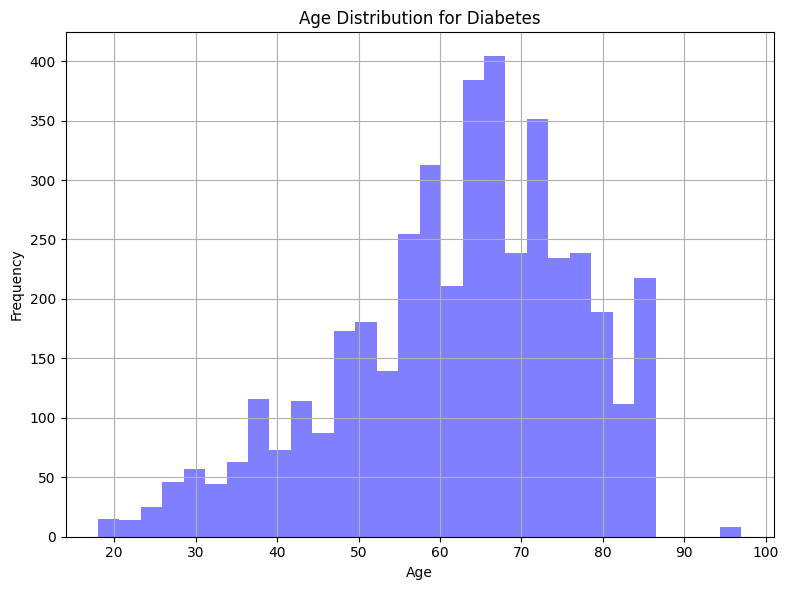

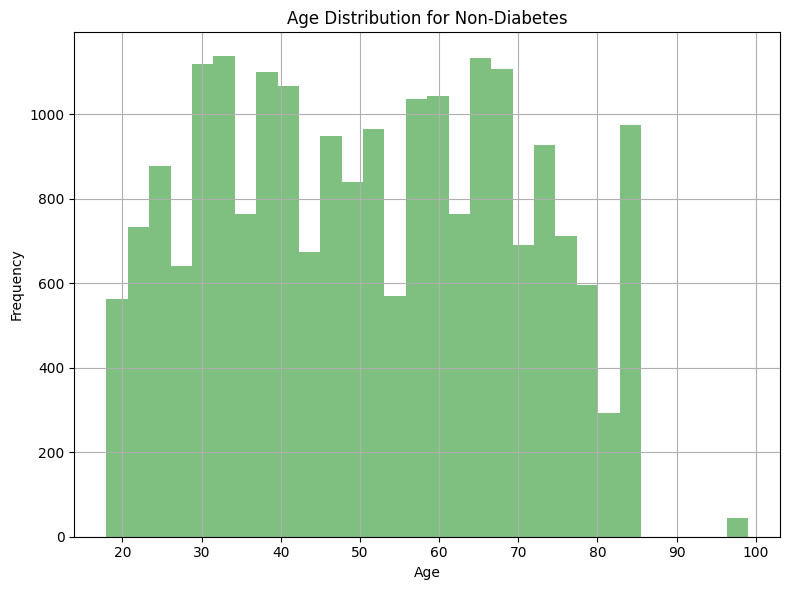

In [ ]:
# Age distribution
diabetes_group = df[df['Diabetes_ever_or_borderline'] == 1]
non_diabetes_group = df[df['Diabetes_ever_or_borderline'] == 0]
0
plt.figure(figsize=(8, 6))
plt.hist(diabetes_group['Age'], bins=30, alpha=0.5, color='blue')
plt.title('Age Distribution for Diabetes')
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.grid(True)
plt.tight_layout()
plt.show()

# Create histogram for individuals without diabetes
plt.figure(figsize=(8, 6))
plt.hist(non_diabetes_group['Age'], bins=30, alpha=0.5, color='green')
plt.title('Age Distribution for Non-Diabetes')
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.grid(True)
plt.tight_layout()
plt.show()

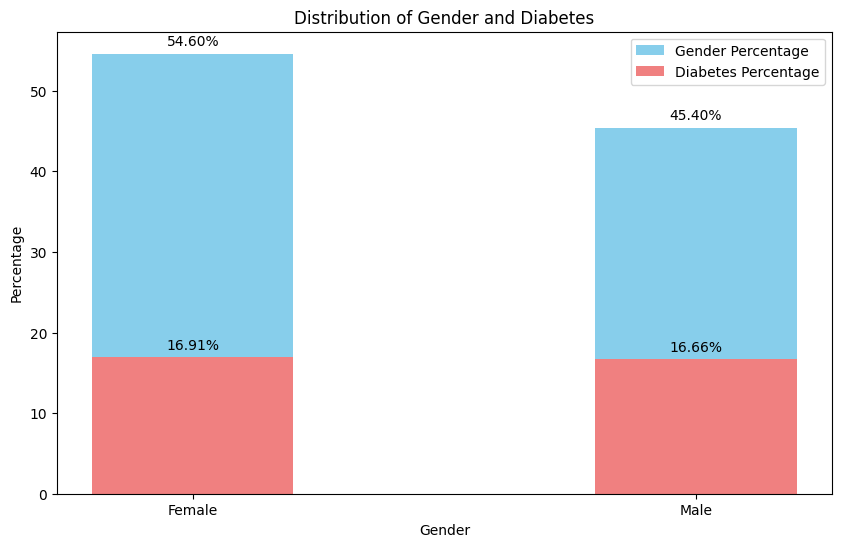

In [ ]:



# Create a copy of the original DataFrame
df_copy = df.copy()

# Apply mappings and preprocessing steps to the copied DataFrame
df_copy['Diabetes_ever_or_borderline'] = df_copy['Diabetes_ever_or_borderline'].map({1: 1, 2: 0})
df_copy['Gender'] = df_copy['Gender'].map({1: 'Male', 2: 'Female'})

# Define variables for visualization
Gender_count = df_copy['Gender'].value_counts()
Total_Samples = len(df_copy)
gender_percentage = (Gender_count / Total_Samples) * 100

diabetes_counts = df_copy.groupby('Gender')['Diabetes_ever_or_borderline'].sum()
diabetes_percentage = (diabetes_counts / Gender_count) * 100

# Plot the distribution
fig, ax = plt.subplots(figsize=(10, 6))
colors = ['skyblue']
bar_gender = ax.bar(gender_percentage.index, gender_percentage.values, color=colors[0], label='Gender Percentage', width=0.4)

colors_diabetes = ['lightcoral']
bars_diabetes = ax.bar(diabetes_percentage.index, diabetes_percentage.values, color=colors_diabetes[0], label='Diabetes Percentage', width=0.4)

ax.set_title('Distribution of Gender and Diabetes')
ax.set_xlabel('Gender')
ax.set_ylabel('Percentage')
ax.legend(loc='upper right', bbox_to_anchor=(1, 1))


for bar, p in zip(bar_gender, gender_percentage.values):
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width() / 2, height + 1, f'{p:.2f}%', ha='center', color='black')

for bar, p in zip(bars_diabetes, diabetes_percentage.values):
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width() / 2, height + 1, f'{p:.2f}%', ha='center', color='black')

plt.show()




Number of individuals without diabetes: 0


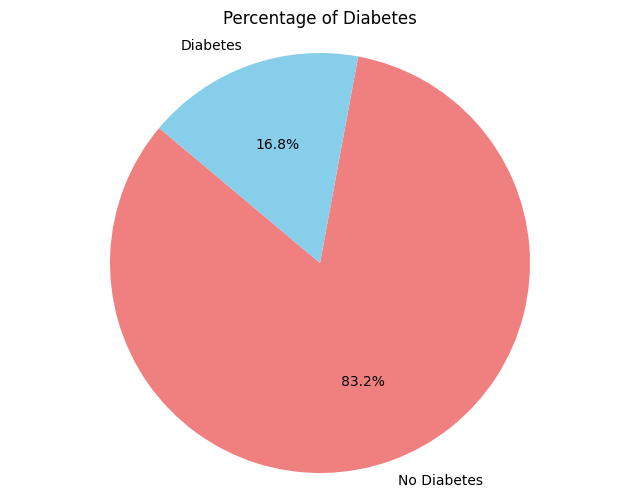

In [ ]:
# Calculate the percentage of diabetes
diabetes_percentage = df['Diabetes_ever_or_borderline'].value_counts(normalize=True) * 100


labels = ['No Diabetes', 'Diabetes']
colors = ['lightcoral', 'skyblue']

plt.figure(figsize=(8, 6))
plt.pie(diabetes_percentage, labels=labels, colors=colors, autopct='%1.1f%%', startangle=140)
plt.title('Percentage of Diabetes')
plt.axis('equal')
plt.show()

In [ ]:
unique_diabetes_values = df['Diabetes_ever_or_borderline'].unique()
print("Unique values for diabetes status:", unique_diabetes_values)

Unique values for diabetes status: [0 1]


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from scipy.stats import chi2_contingency

from scipy.stats import mannwhitneyu

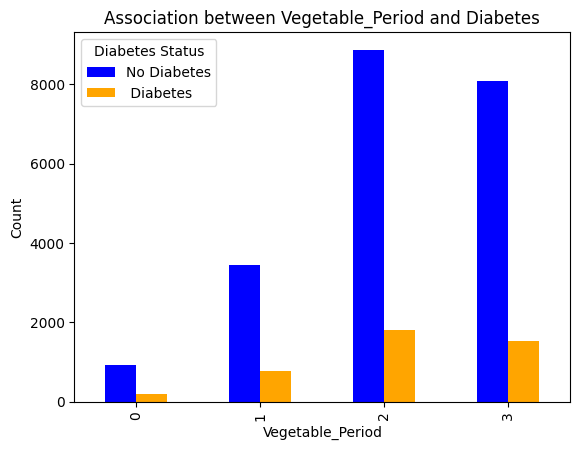

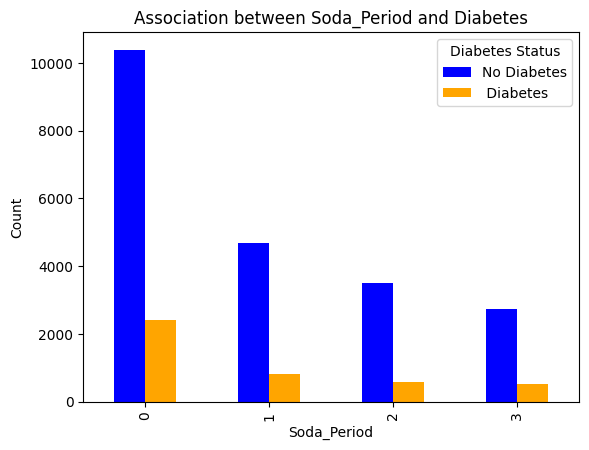

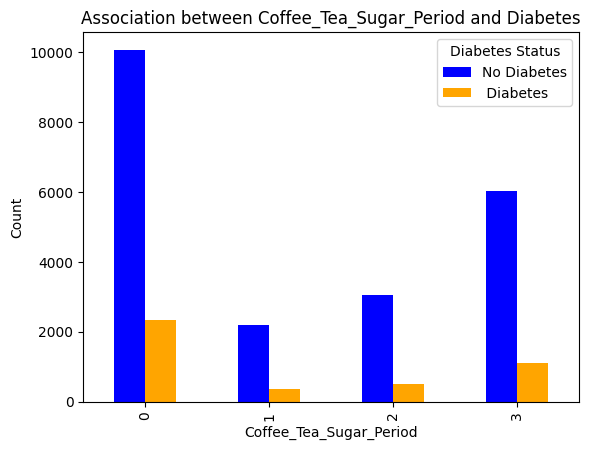

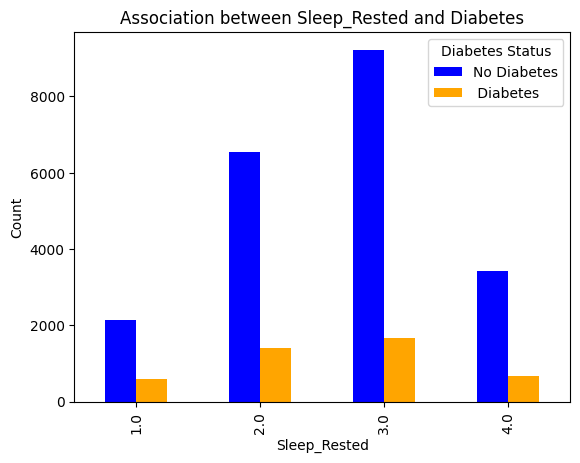

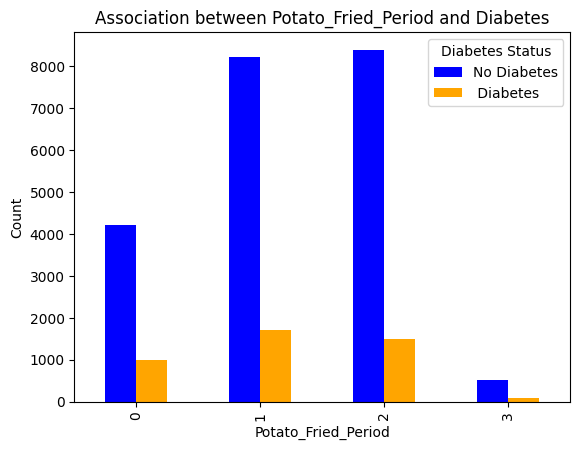

...

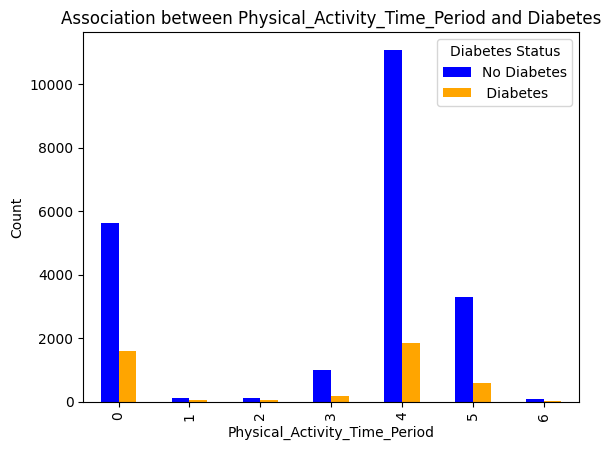

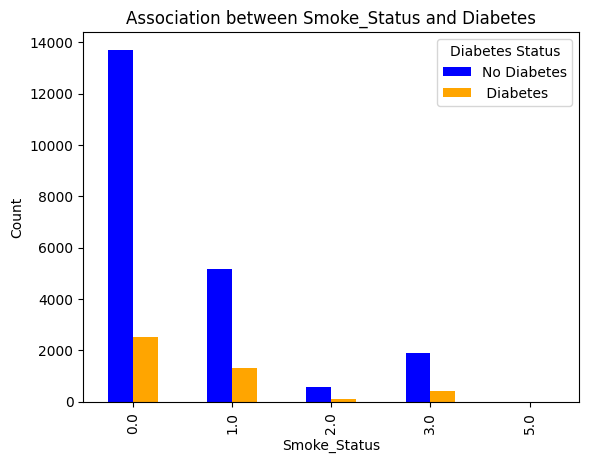

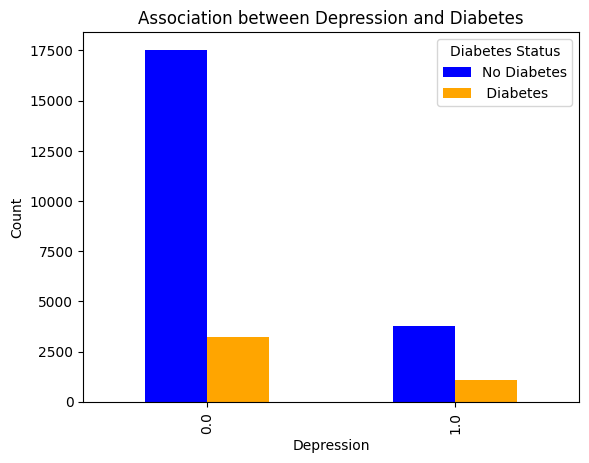

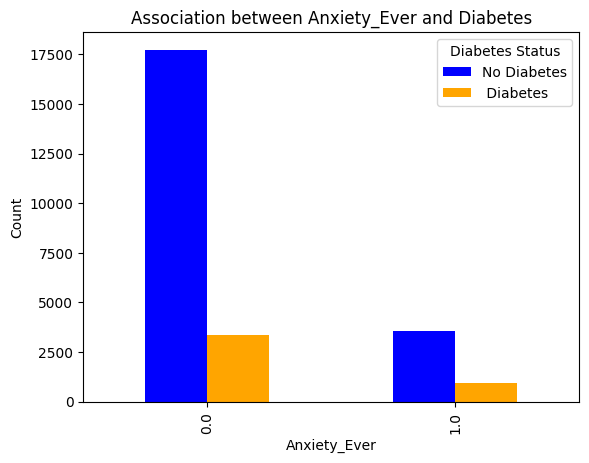

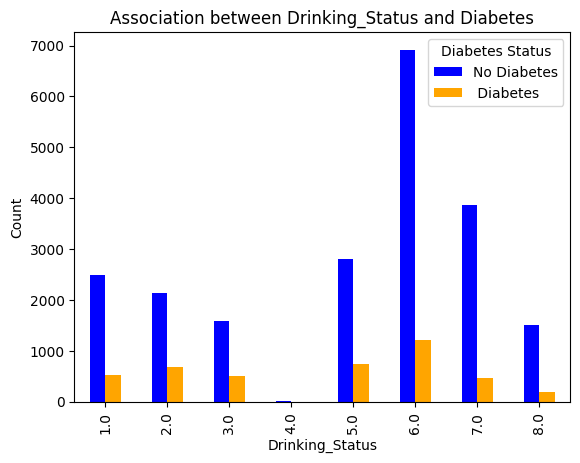

In [ ]:
####### create grouped bar graphs to analyze the association between each variable and diabetes status.


# Define the variables to analyze
variables = ['Vegetable_Period', 'Soda_Period', 'Coffee_Tea_Sugar_Period',
             'Sleep_Rested', 'Potato_Fried_Period', 'Pizza_Period',
             'Physical_Activity_Time_Period', 'Smoke_Status', 'Depression',
             'Anxiety_Ever', 'Drinking_Status']

# Loop through each variable and create a grouped bar graph
for variable in variables:
    contingency_table = pd.crosstab(df[variable], df['Diabetes_ever_or_borderline'])
    ax = contingency_table.plot(kind='bar', color=['blue', 'orange'])
    plt.title(f'Association between {variable} and Diabetes')
    plt.xlabel(variable)
    plt.ylabel('Count')
    plt.legend(title='Diabetes Status', labels=['No Diabetes', ' Diabetes'])


In [ ]:
print("Number of individuals with diabetes:", len(diabetes_group))
print("Number of individuals without diabetes:", len(non_diabetes_group))

Number of individuals with diabetes: 4304
Number of individuals without diabetes: 21317


In [ ]:

from scipy.stats import mannwhitneyu

# Perform Mann-Whitney U test
u_stat, p_value = mannwhitneyu(diabetes_group['Age'], non_diabetes_group['Age'])

print("U-statistic:", u_stat)
print("P-value:", p_value)

U-statistic: 61696184.0
P-value: 6.0500996505028155e-280


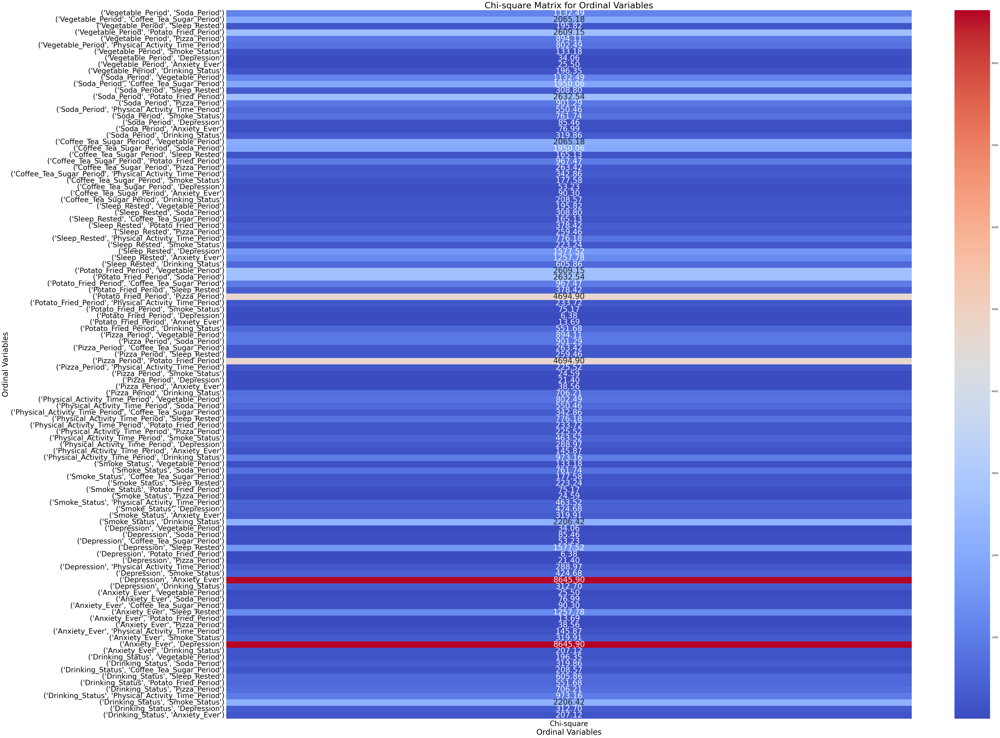

In [ ]:
### heatmap visualization of the chi-square matrix for the ordinal variables

ordinal_vars = ['Vegetable_Period', 'Soda_Period', 'Coffee_Tea_Sugar_Period', 'Sleep_Rested', 'Potato_Fried_Period', 'Pizza_Period', 'Physical_Activity_Time_Period', 'Smoke_Status', 'Depression', 'Anxiety_Ever', 'Drinking_Status']

# Calculate chi-square statistics for each pair of ordinal variables
chi2_results = {}
for var1 in ordinal_vars:
    for var2 in ordinal_vars:
        if var1 != var2:
            contingency_table = pd.crosstab(df[var1], df[var2])
            chi2, _, _, _ = chi2_contingency(contingency_table)
            chi2_results[(var1, var2)] = chi2

# Create a DataFrame from the chi-square results
chi2_df = pd.DataFrame.from_dict(chi2_results, orient='index', columns=['Chi-square'])

plt.figure(figsize=(60, 50))

sns.heatmap(chi2_df, annot=True, cmap='coolwarm', fmt=".2f", annot_kws={"size": 30})
plt.title('Chi-square Matrix for Ordinal Variables', fontsize=34)
plt.xlabel('Ordinal Variables', fontsize=30)
plt.ylabel('Ordinal Variables', fontsize=30)
plt.xticks(fontsize=28)
plt.yticks(fontsize=28)
plt.show()

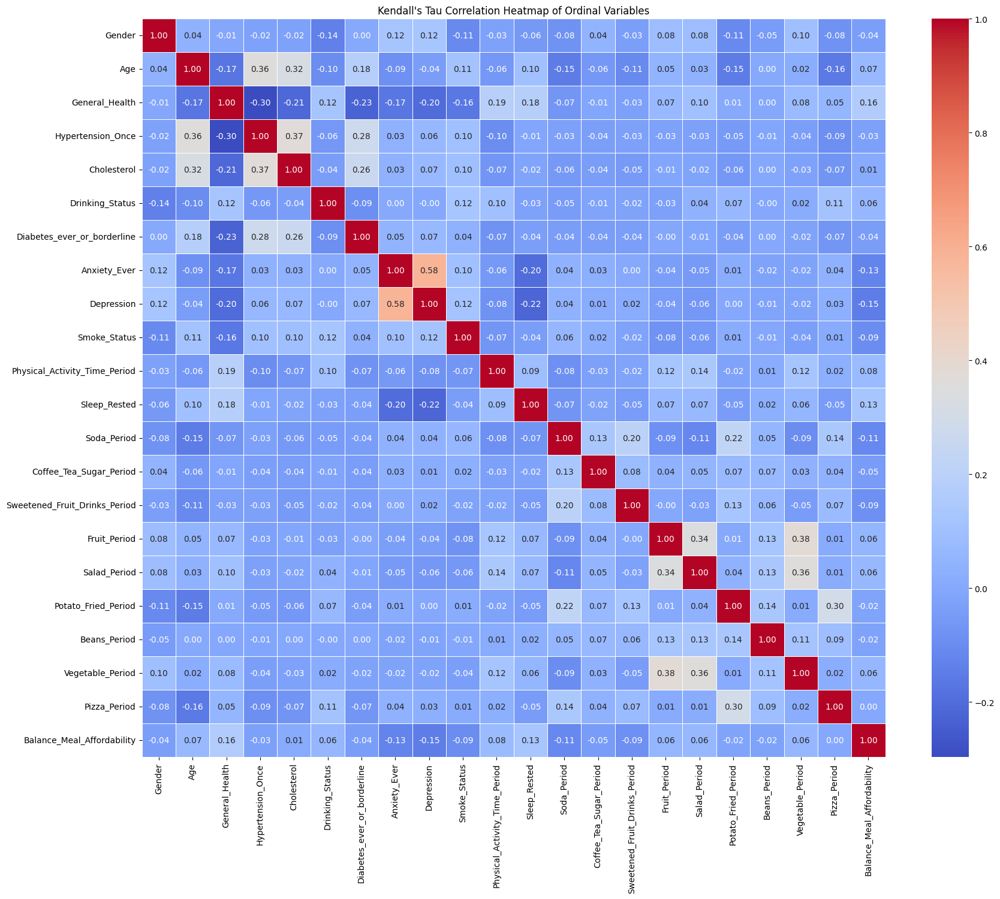

In [ ]:

#####  heatmap visualization of the Kendall's Tau correlation matrix


correlation_matrix = df.corr(method='kendall')

plt.figure(figsize=(20, 16))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Kendall\'s Tau Correlation Heatmap of Ordinal Variables')
plt.show()

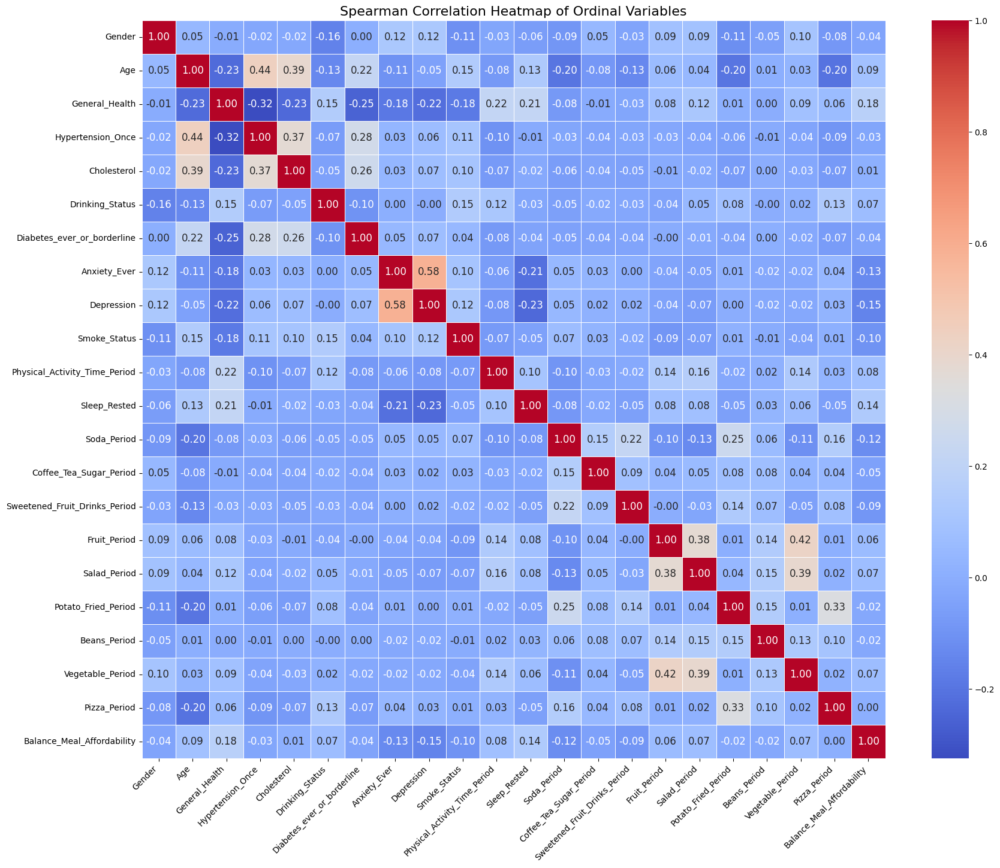

In [ ]:
###  heatmap visualization of the Spearman correlation matrix for the ordinal variables

correlation_matrix = df.corr(method='spearman')

plt.figure(figsize=(20, 16))
ax = sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5,
                 annot_kws={"size": 12})
plt.title('Spearman Correlation Heatmap of Ordinal Variables', fontsize=16)
ax.set_xticklabels(df.columns, rotation=45, ha='right', fontsize=10)
ax.set_yticklabels(df.columns, rotation=0, ha='right', fontsize=10)

plt.show()

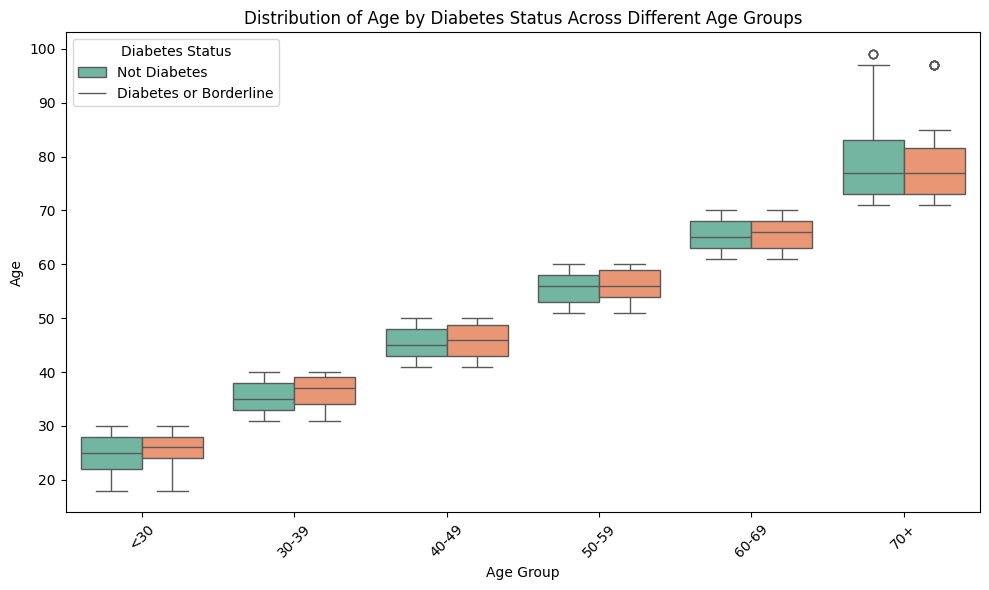

In [ ]:
# Define age groups
age_groups = ['<30', '30-39', '40-49', '50-59', '60-69', '70+']

# Categorize individuals into age groups
df['Age_Group'] = pd.cut(df['Age'], bins=[0, 30, 40, 50, 60, 70, float('inf')], labels=age_groups)

plt.figure(figsize=(10, 6))
sns.boxplot(x='Age_Group', y='Age', hue='Diabetes_ever_or_borderline', data=df, palette='Set2')
plt.title('Distribution of Age by Diabetes Status Across Different Age Groups')
plt.xlabel('Age Group')
plt.ylabel('Age')
plt.xticks(rotation=45)
plt.legend(title='Diabetes Status', labels=['Not Diabetes', 'Diabetes or Borderline'])
plt.tight_layout()
plt.show()

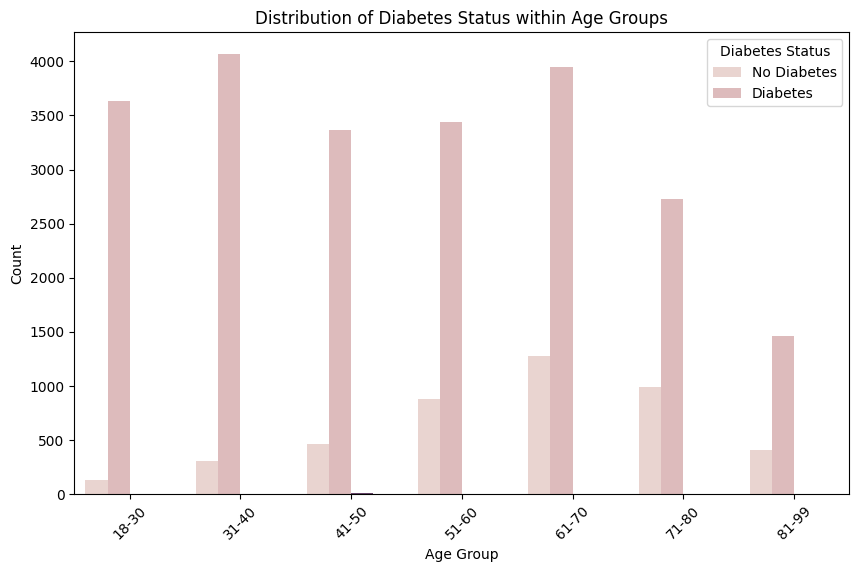

Chi-square statistic: 1439.9412083677312
P-value: 3.7895089188832947e-295


In [ ]:



age_bins = [18, 30, 40, 50, 60, 70, 80, 99]
age_labels = ['18-30', '31-40', '41-50', '51-60', '61-70', '71-80', '81-99']

df_filtered['Age_Group'] = pd.cut(df_filtered['Age'], bins=age_bins, labels=age_labels)


plt.figure(figsize=(10, 6))
sns.countplot(data=df_filtered, x='Age_Group', hue='Diabetes_ever_or_borderline')
plt.title('Distribution of Diabetes Status within Age Groups')
plt.xlabel('Age Group')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='Diabetes Status', labels=['No Diabetes', 'Diabetes'])
plt.show()

# Perform Chi-square test
cross_tab = pd.crosstab(df_filtered['Age_Group'], df_filtered['Diabetes_ever_or_borderline'])
chi2, p_value, _, _ = chi2_contingency(cross_tab)

print("Chi-square statistic:", chi2)
print("P-value:", p_value)

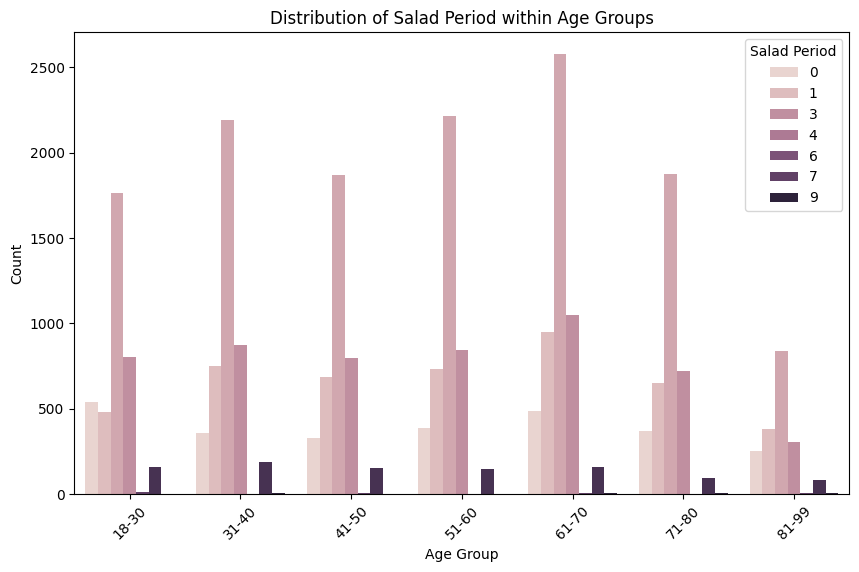

In [ ]:

age_bins = [18, 30, 40, 50, 60, 70, 80, 99]
age_labels = ['18-30', '31-40', '41-50', '51-60', '61-70', '71-80', '81-99']


df_filtered['Age_Group'] = pd.cut(df_filtered['Age'], bins=age_bins, labels=age_labels)


plt.figure(figsize=(10, 6))
sns.countplot(data=df_filtered, x='Age_Group', hue='Salad_Period')
plt.title('Distribution of Salad Period within Age Groups')
plt.xlabel('Age Group')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='Salad Period')
plt.show()

<ipython-input-33-14d30f17792d>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Age_Group', y='Salad_Period', data=df, order=age_groups, palette='Set2')


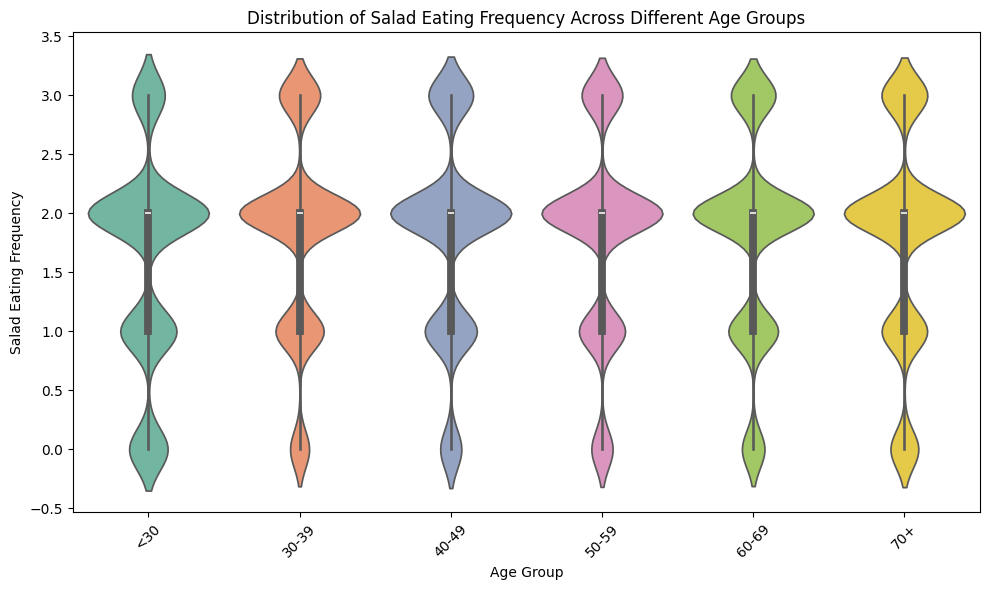

In [ ]:
age_groups = ['<30', '30-39', '40-49', '50-59', '60-69', '70+']


plt.figure(figsize=(10, 6))
sns.violinplot(x='Age_Group', y='Salad_Period', data=df, order=age_groups, palette='Set2')
plt.title('Distribution of Salad Eating Frequency Across Different Age Groups')
plt.xlabel('Age Group')
plt.ylabel('Salad Eating Frequency')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


# **Filter age. older than 40**

In [ ]:
# Filter rows where age is greater than or equal to 40
df = df[df['Age'] >=40]

# Check the shape of the filtered DataFrame
print("Original Shape:", df.shape)
print("Shape after filtering rows younger than 40:", df.shape)

Original Shape: (18307, 23)
Shape after filtering rows younger than 40: (18307, 23)


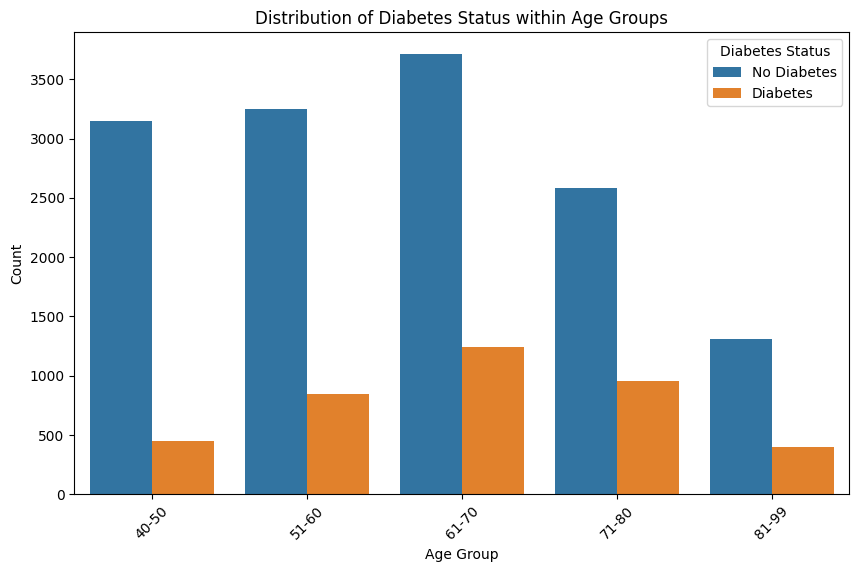

Chi-square statistic: 278.7766550053028
P-value: 4.090246898799554e-59


In [ ]:

df = df[df['Age'] >= 40]


age_bins = [40, 50, 60, 70, 80, 99]
age_labels = ['40-50','51-60','61-70', '71-80', '81-99']

df['Age_Group'] = pd.cut(df['Age'], bins=age_bins, labels=age_labels)

plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='Age_Group', hue='Diabetes_ever_or_borderline')
plt.title('Distribution of Diabetes Status within Age Groups')
plt.xlabel('Age Group')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='Diabetes Status', labels=['No Diabetes', 'Diabetes'])
plt.show()

# Perform Chi-square test for association between age group and diabetes status
cross_tab = pd.crosstab(df['Age_Group'], df['Diabetes_ever_or_borderline'])
chi2, p_value, _, _ = chi2_contingency(cross_tab)

print("Chi-square statistic:", chi2)
print("P-value:", p_value)

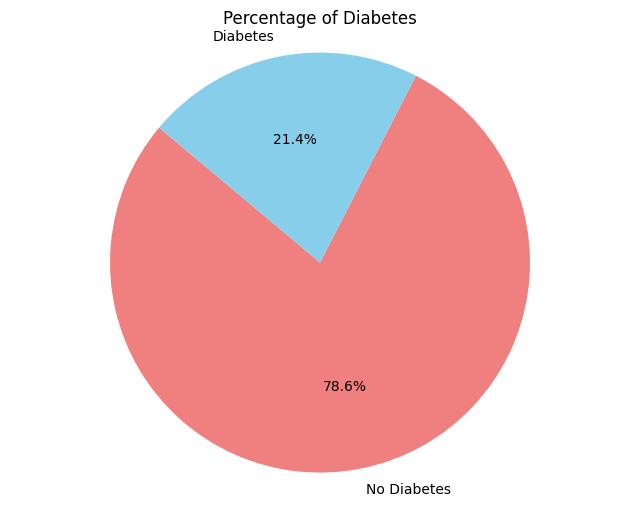

In [ ]:
##### check the distribution of diabetes and non-diabetes individuals after filtering

diabetes_percentage = df['Diabetes_ever_or_borderline'].value_counts(normalize=True) * 100


labels = ['No Diabetes', 'Diabetes']
colors = ['lightcoral', 'skyblue']

plt.figure(figsize=(8, 6))
plt.pie(diabetes_percentage, labels=labels, colors=colors, autopct='%1.1f%%', startangle=140)
plt.title('Percentage of Diabetes')
plt.axis('equal')
plt.show()

# **Balance**

In [ ]:
from imblearn.under_sampling import RandomUnderSampler

# Separate features (X) and target variable (y)
X = df.drop(columns=['Diabetes_ever_or_borderline'])
y = df['Diabetes_ever_or_borderline']

# Instantiate RandomUnderSampler
undersampler = RandomUnderSampler()

# Fit and transform the data
X_resampled, y_resampled = undersampler.fit_resample(X, y)

print("Count of samples in each class after undersampling:")
print(pd.Series(y_resampled).value_counts())

Count of samples in each class after undersampling:
Diabetes_ever_or_borderline
0    3924
1    3924
Name: count, dtype: int64


In [ ]:
# Convert balanced data to DataFrame
df_balanced = pd.concat([pd.DataFrame(X_resampled, columns=X.columns), pd.DataFrame(y_resampled, columns=['Diabetes_ever_or_borderline'])], axis=1)


In [ ]:
unique_diabetes_values = df['Diabetes_ever_or_borderline'].unique()
print("Unique values for diabetes status:", unique_diabetes_values)

Unique values for diabetes status: [0 1]


In [ ]:
unique_diabetes_values = df['Salad_Period'].unique()
print("Unique values for Salad_Period status:", unique_diabetes_values)

Unique values for Salad_Period status: [1 2 0 3]


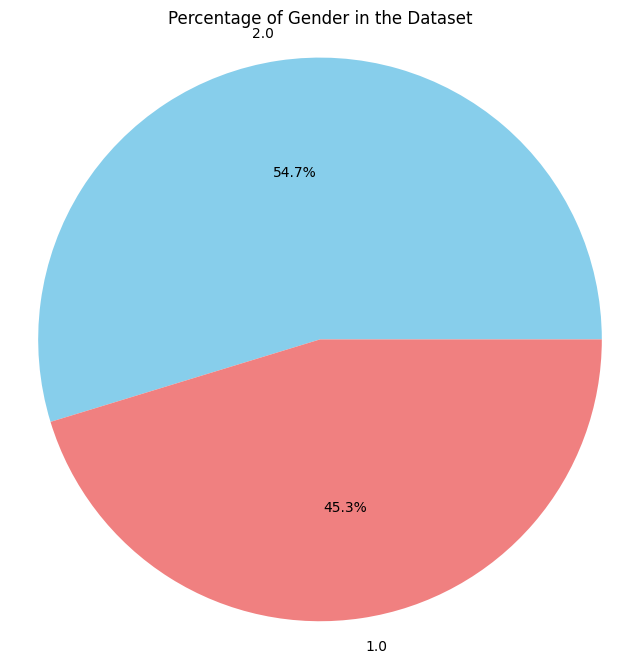

In [ ]:
# gender  percentage after filtering and balancing
gender_counts = df_balanced['Gender'].value_counts()

plt.figure(figsize=(8, 8))
plt.pie(gender_counts, labels=gender_counts.index, autopct='%1.1f%%', colors=['skyblue', 'lightcoral'])
plt.title('Percentage of Gender in the Dataset')
plt.axis('equal')
plt.show()

# **Visualization**

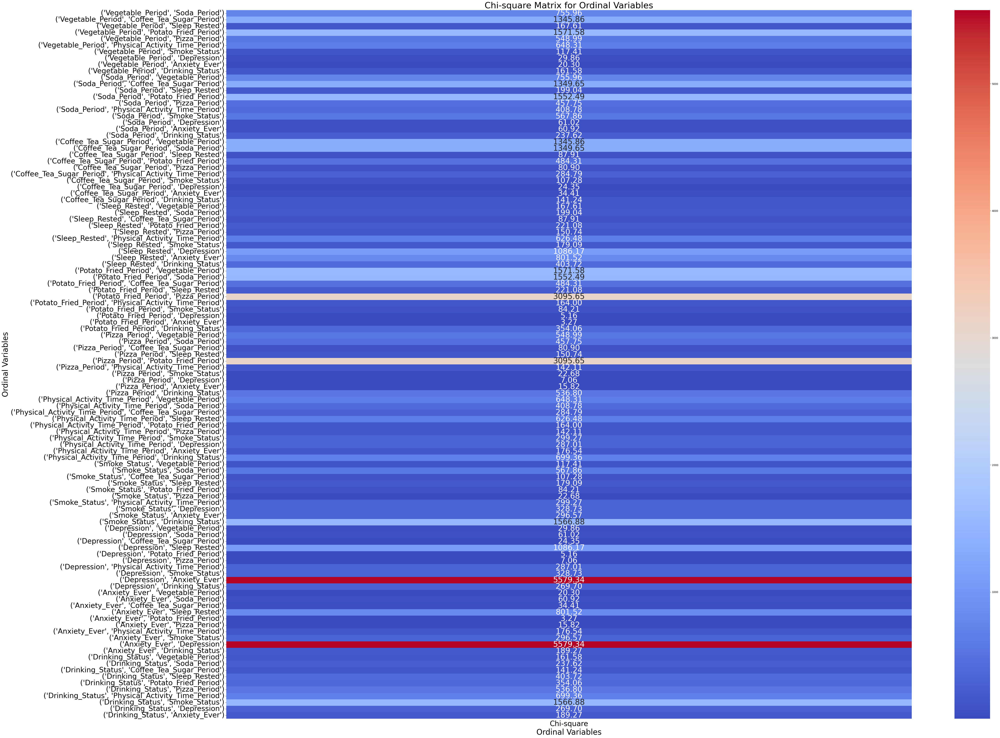

In [ ]:
# Calculate chi-square statistics for each pair of ordinal variables


ordinal_vars = ['Vegetable_Period', 'Soda_Period', 'Coffee_Tea_Sugar_Period', 'Sleep_Rested', 'Potato_Fried_Period', 'Pizza_Period', 'Physical_Activity_Time_Period', 'Smoke_Status', 'Depression', 'Anxiety_Ever', 'Drinking_Status']

chi2_results = {}
for var1 in ordinal_vars:
    for var2 in ordinal_vars:
        if var1 != var2:
            contingency_table = pd.crosstab(df[var1], df[var2])
            chi2, _, _, _ = chi2_contingency(contingency_table)
            chi2_results[(var1, var2)] = chi2


chi2_df = pd.DataFrame.from_dict(chi2_results, orient='index', columns=['Chi-square'])

plt.figure(figsize=(60, 50))

sns.heatmap(chi2_df, annot=True, cmap='coolwarm', fmt=".2f", annot_kws={"size": 30})
plt.title('Chi-square Matrix for Ordinal Variables', fontsize=34)
plt.xlabel('Ordinal Variables', fontsize=30)
plt.ylabel('Ordinal Variables', fontsize=30)
plt.xticks(fontsize=28)
plt.yticks(fontsize=28)
plt.show()


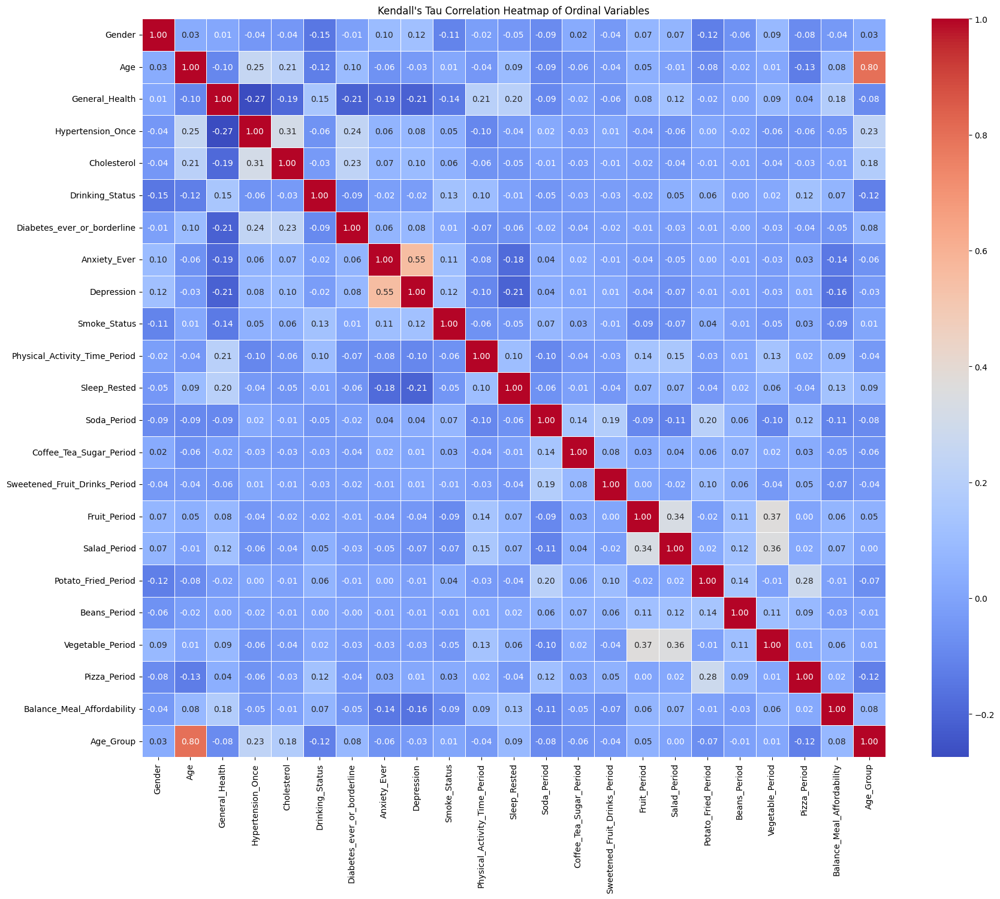

In [ ]:
#####  heatmap visualization of the Kendall's Tau correlation matrix



label_encoder = LabelEncoder()
df['Age_Group'] = label_encoder.fit_transform(df['Age_Group'])

correlation_matrix = df.corr(method='kendall')

plt.figure(figsize=(20, 16))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Kendall\'s Tau Correlation Heatmap of Ordinal Variables')
plt.show()

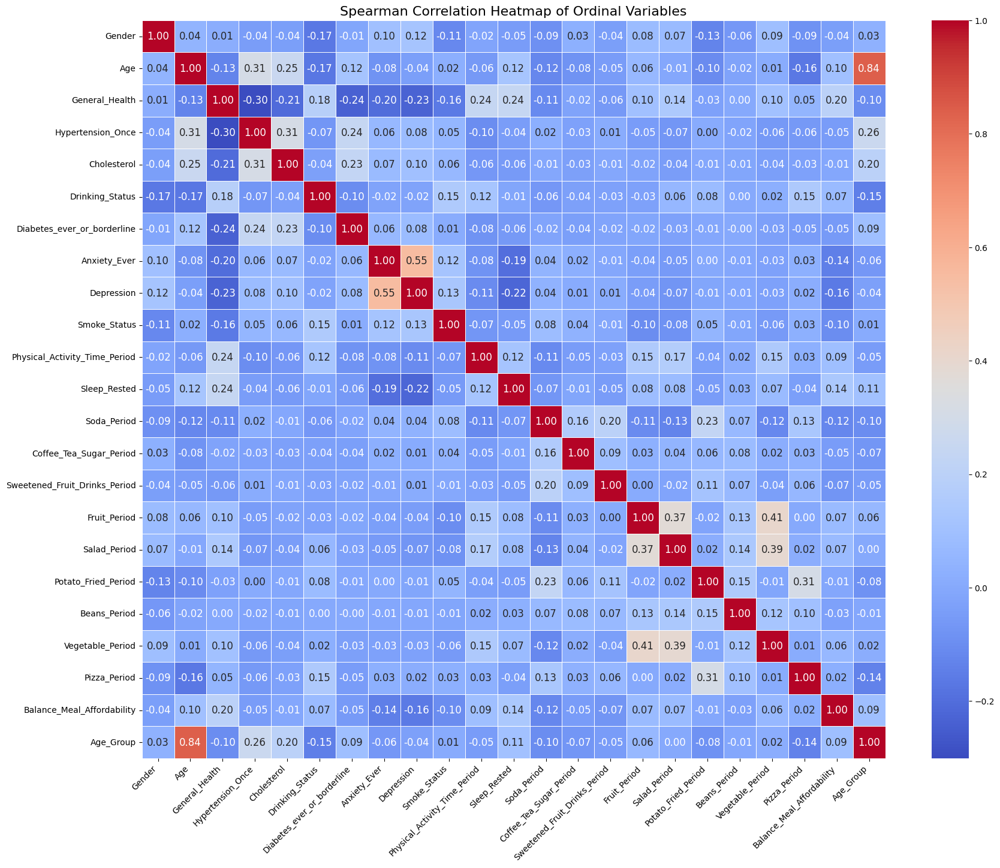

In [ ]:
###  heatmap visualization of the Spearman correlation matrix for the ordinal variables


from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
df['Age_Group'] = label_encoder.fit_transform(df['Age_Group'])


correlation_matrix = df.corr(method='spearman')

plt.figure(figsize=(20, 16))
ax = sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5,
                 annot_kws={"size": 12})
plt.title('Spearman Correlation Heatmap of Ordinal Variables', fontsize=16)

ax.set_xticklabels(df.columns, rotation=45, ha='right', fontsize=10)
ax.set_yticklabels(df.columns, rotation=0, ha='right', fontsize=10)

plt.show()

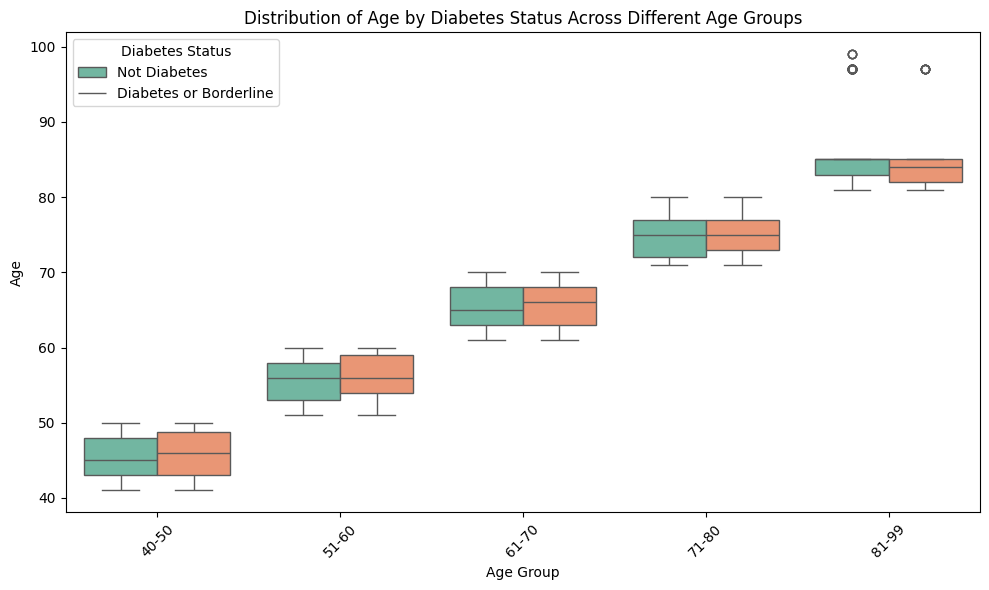

In [ ]:
# Categorize individuals into age groups
df['Age_Group'] = pd.cut(df['Age'], bins=[40, 50, 60, 70, 80, 99], labels=['40-50', '51-60', '61-70', '71-80', '81-99'])

plt.figure(figsize=(10, 6))
sns.boxplot(x='Age_Group', y='Age', hue='Diabetes_ever_or_borderline', data=df, palette='Set2')
plt.title('Distribution of Age by Diabetes Status Across Different Age Groups')
plt.xlabel('Age Group')
plt.ylabel('Age')
plt.xticks(rotation=45)
plt.legend(title='Diabetes Status', labels=['Not Diabetes', 'Diabetes or Borderline'])
plt.tight_layout()
plt.show()


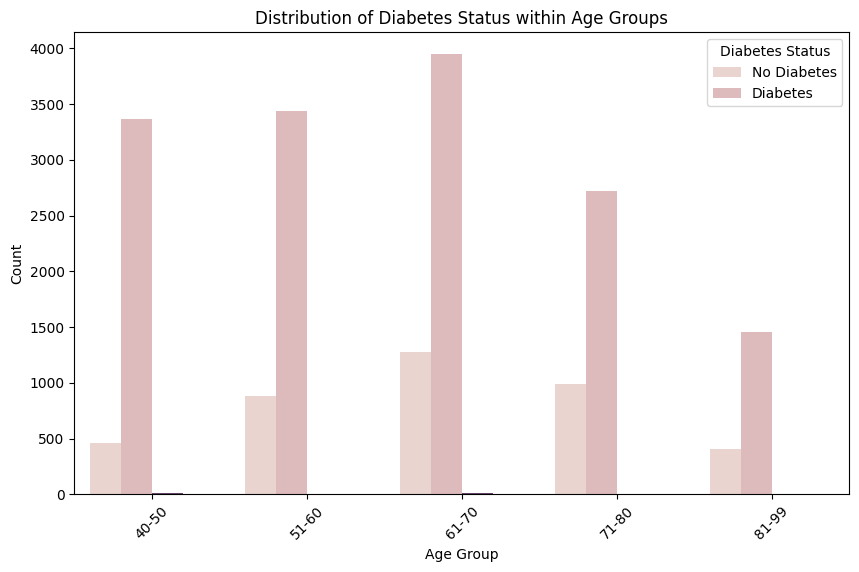

Chi-square statistic: 304.7298568635104
P-value: 4.768572915790266e-58


In [ ]:



age_bins = [40, 50, 60, 70, 80, 99]
age_labels = ['40-50', '51-60', '61-70', '71-80', '81-99']


df_filtered['Age_Group'] = pd.cut(df_filtered['Age'], bins=age_bins, labels=age_labels)


plt.figure(figsize=(10, 6))
sns.countplot(data=df_filtered, x='Age_Group', hue='Diabetes_ever_or_borderline')
plt.title('Distribution of Diabetes Status within Age Groups')
plt.xlabel('Age Group')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='Diabetes Status', labels=['No Diabetes', 'Diabetes'])
plt.show()
cross_tab = pd.crosstab(df_filtered['Age_Group'], df_filtered['Diabetes_ever_or_borderline'])
chi2, p_value, _, _ = chi2_contingency(cross_tab)

print("Chi-square statistic:", chi2)
print("P-value:", p_value)


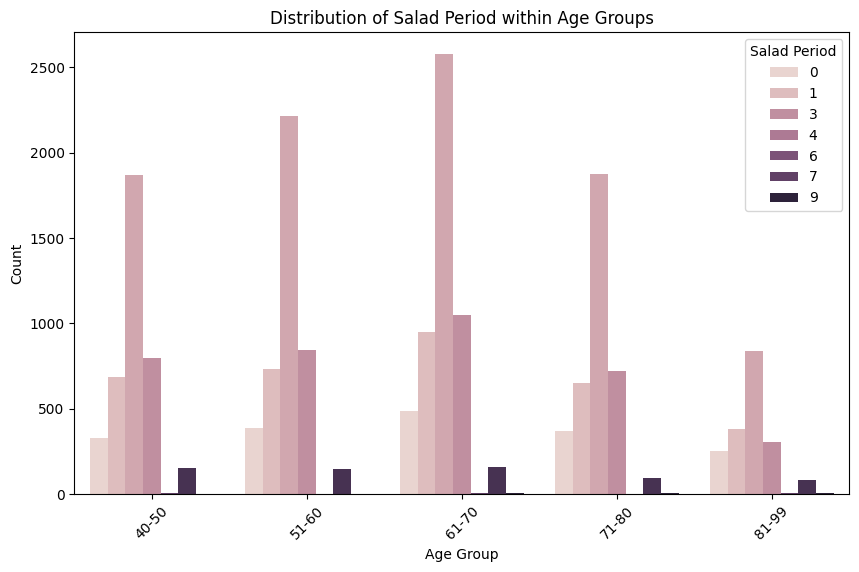

In [ ]:

age_bins = [40, 50, 60, 70, 80, 99]
age_labels = ['40-50', '51-60', '61-70', '71-80', '81-99']

df_filtered['Age_Group'] = pd.cut(df_filtered['Age'], bins=age_bins, labels=age_labels)

plt.figure(figsize=(10, 6))
sns.countplot(data=df_filtered, x='Age_Group', hue='Salad_Period')
plt.title('Distribution of Salad Period within Age Groups')
plt.xlabel('Age Group')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='Salad Period')
plt.show()


In [ ]:
unique_diabetes_values = df['Salad_Period'].unique()
print("Unique values for Salad_Period status:", unique_diabetes_values)

Unique values for Salad_Period status: [1 2 0 3]


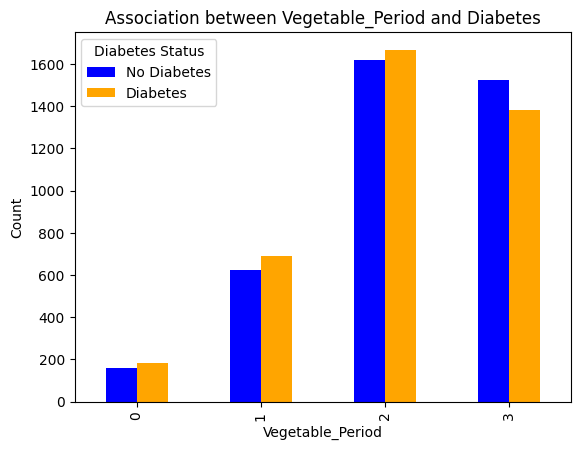

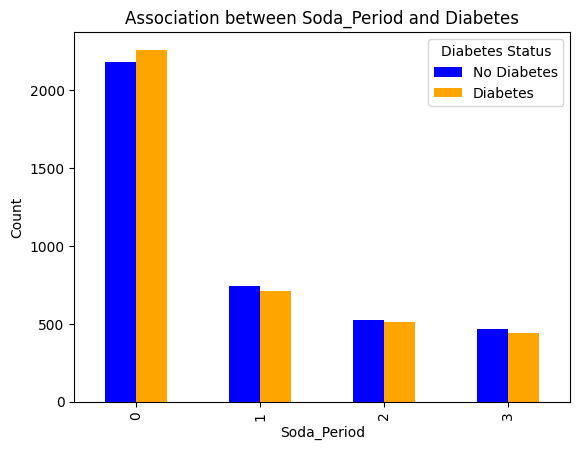

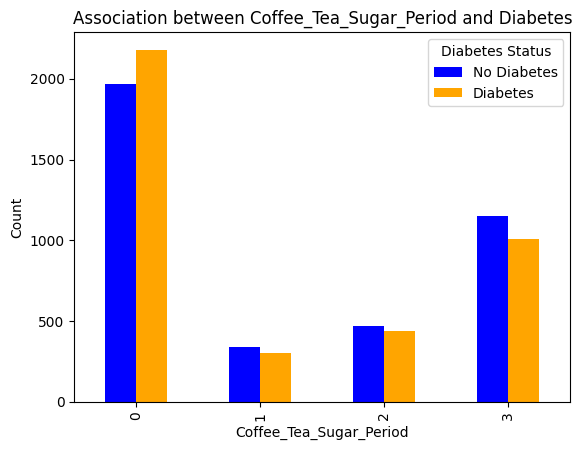

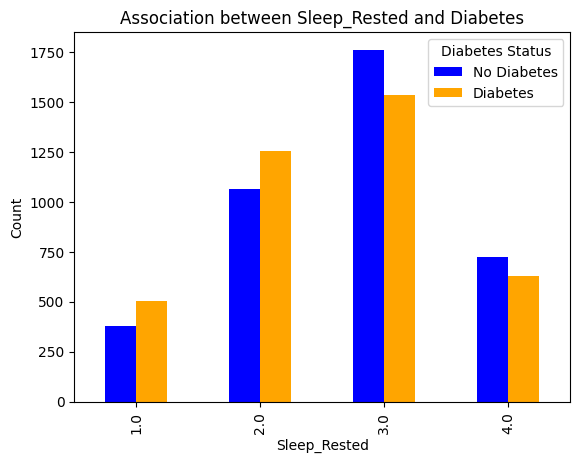

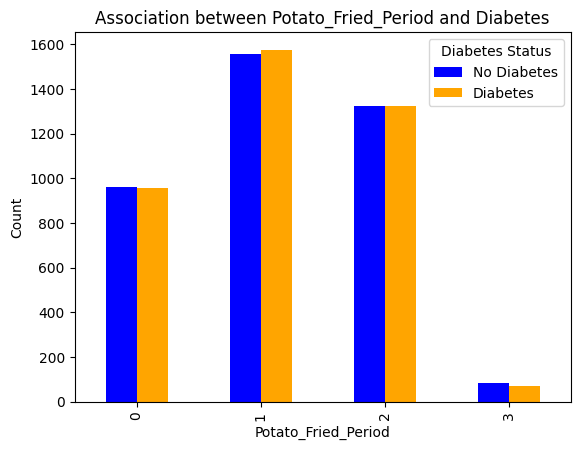

...

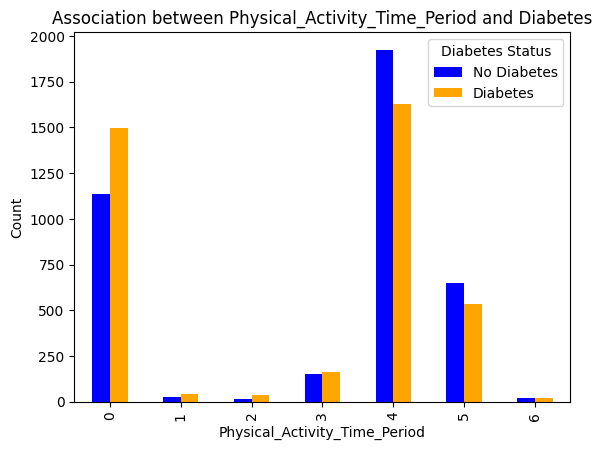

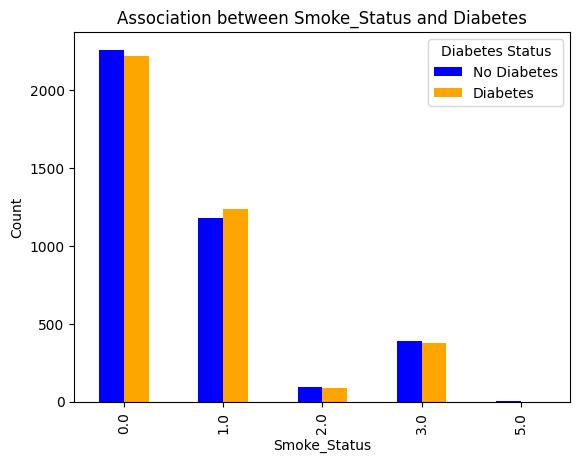

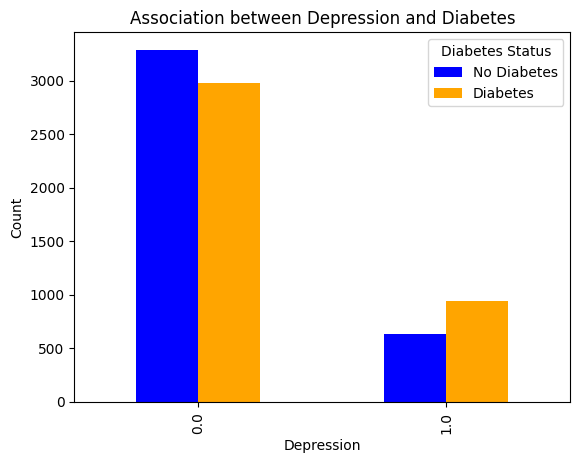

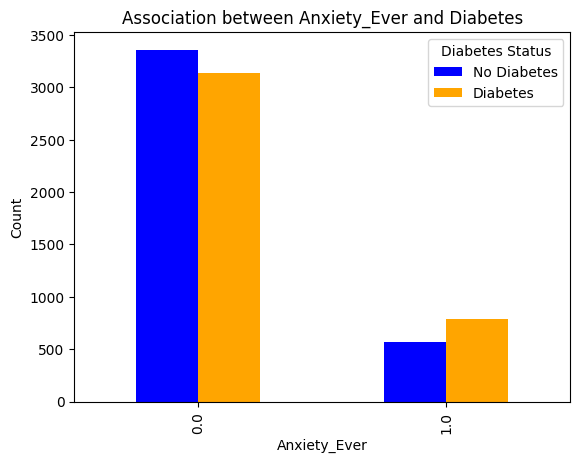

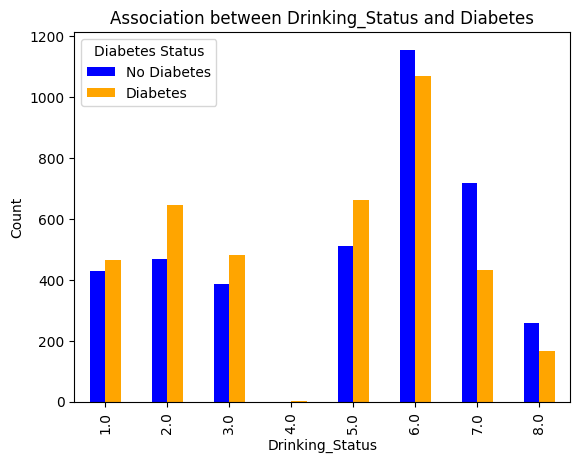

In [ ]:

variables = ['Vegetable_Period', 'Soda_Period', 'Coffee_Tea_Sugar_Period',
             'Sleep_Rested', 'Potato_Fried_Period', 'Pizza_Period',
             'Physical_Activity_Time_Period', 'Smoke_Status', 'Depression',
             'Anxiety_Ever', 'Drinking_Status']


for variable in variables:

    contingency_table = pd.crosstab(df_balanced[variable], df_balanced['Diabetes_ever_or_borderline'])


    ax = contingency_table.plot(kind='bar', color=['blue', 'orange'])
    plt.title(f'Association between {variable} and Diabetes')
    plt.xlabel(variable)
    plt.ylabel('Count')
    plt.legend(title='Diabetes Status', labels=['No Diabetes', 'Diabetes'])
    plt.show()

In [ ]:
df_balanced.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28766 entries, 0 to 28765
Data columns (total 23 columns):
 #   Column                         Non-Null Count  Dtype   
---  ------                         --------------  -----   
 0   Gender                         28766 non-null  float64 
 1   Age                            28766 non-null  int64   
 2   General_Health                 28766 non-null  int64   
 3   Hypertension_Once              28766 non-null  float64 
 4   Cholesterol                    28766 non-null  float64 
 5   Drinking_Status                28766 non-null  float64 
 6   Anxiety_Ever                   28766 non-null  float64 
 7   Depression                     28766 non-null  float64 
 8   Smoke_Status                   28766 non-null  float64 
 9   Physical_Activity_Time_Period  28766 non-null  int64   
 10  Sleep_Rested                   28766 non-null  float64 
 11  Soda_Period                    28766 non-null  int64   
 12  Coffee_Tea_Sugar_Period        2

## **Analysis**

In [ ]:

# Perform Mann-Whitney U test
u_stat, p_value_mannwhitney = mannwhitneyu(df[df['Diabetes_ever_or_borderline'] == 1]['Age'],
                                            df[df['Diabetes_ever_or_borderline'] == 0]['Age'])

print("Mann-Whitney U Test:")
print("U-statistic:", u_stat)
print("P-value:", p_value_mannwhitney)

Mann-Whitney U Test:
U-statistic: 32863814.0
P-value: 1.8685465508202128e-56


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 18307 entries, 0 to 27650
Data columns (total 23 columns):
 #   Column                         Non-Null Count  Dtype   
---  ------                         --------------  -----   
 0   Gender                         18307 non-null  float64 
 1   Age                            18307 non-null  int64   
 2   General_Health                 18307 non-null  int64   
 3   Hypertension_Once              18307 non-null  float64 
 4   Cholesterol                    18307 non-null  float64 
 5   Drinking_Status                18307 non-null  float64 
 6   Diabetes_ever_or_borderline    18307 non-null  int64   
 7   Anxiety_Ever                   18307 non-null  float64 
 8   Depression                     18307 non-null  float64 
 9   Smoke_Status                   18307 non-null  float64 
 10  Physical_Activity_Time_Period  18307 non-null  int64   
 11  Sleep_Rested                   18307 non-null  float64 
 12  Soda_Period                    18307 

In [ ]:
# Perform chi-square test of independence for each variable
categorical_variables = ['Gender', 'General_Health', 'Hypertension_Once', 'Cholesterol', 'Drinking_Status',
                         'Anxiety_Ever', 'Depression', 'Smoke_Status', 'Physical_Activity_Time_Period',
                         'Sleep_Rested', 'Soda_Period', 'Coffee_Tea_Sugar_Period', 'Sweetened_Fruit_Drinks_Period',
                         'Fruit_Period', 'Salad_Period', 'Potato_Fried_Period', 'Beans_Period', 'Vegetable_Period',
                         'Pizza_Period', 'Balance_Meal_Affordability']


results = {}
for variable in categorical_variables:
    contingency_table = pd.crosstab(df[variable], df['Diabetes_ever_or_borderline'])
    chi2_stat, p_value_chi2, _, _ = chi2_contingency(contingency_table)
    results[variable] = {'Chi-square statistic': chi2_stat, 'P-value': p_value_chi2}

# Print the results
for variable, result in results.items():
    print("Chi-square Test for Association between", variable, "and Diabetes Status:")
    print("Chi-square statistic:", result['Chi-square statistic'])
    print("P-value:", result['P-value'])
    print()

Chi-square Test for Association between Gender and Diabetes Status:
Chi-square statistic: 3.683282343027583
P-value: 0.05496055343499648

Chi-square Test for Association between General_Health and Diabetes Status:
Chi-square statistic: 1013.005762027926
P-value: 5.420411019940082e-218

Chi-square Test for Association between Hypertension_Once and Diabetes Status:
Chi-square statistic: 1047.3182014933593
P-value: 9.315993899270517e-230

Chi-square Test for Association between Cholesterol and Diabetes Status:
Chi-square statistic: 965.8028494287383
P-value: 4.871057427469568e-212

Chi-square Test for Association between Drinking_Status and Diabetes Status:
Chi-square statistic: 244.11324187158255
P-value: 4.9570490820379035e-49

Chi-square Test for Association between Anxiety_Ever and Diabetes Status:
Chi-square statistic: 75.41615471215258
P-value: 3.81257833947751e-18

Chi-square Test for Association between Depression and Diabetes Status:
Chi-square statistic: 117.15922661667408
P-val

In [ ]:
# Compute Cramer's V for diabetes and each ordinal variable
ordinal_vars = ['Age', 'General_Health', 'Hypertension_Once', 'Cholesterol', 'Drinking_Status', 'Anxiety_Ever', 'Depression', 'Smoke_Status', 'Physical_Activity_Time_Period', 'Sleep_Rested', 'Soda_Period', 'Coffee_Tea_Sugar_Period', 'Sweetened_Fruit_Drinks_Period', 'Fruit_Period', 'Salad_Period', 'Potato_Fried_Period', 'Beans_Period', 'Vegetable_Period', 'Pizza_Period', 'Balance_Meal_Affordability']


for var in ordinal_vars:
    contingency_table = pd.crosstab(df['Diabetes_ever_or_borderline'], df[var])
    chi2, _, _, _ = chi2_contingency(contingency_table)
    n = contingency_table.sum().sum()
    v = np.sqrt(chi2 / (n * (min(contingency_table.shape) - 1)))
    print(f"Cramer's V for Diabetes_Status and {var}: {v}")

Cramer's V for Diabetes_Status and Age: 0.14722202156757988
Cramer's V for Diabetes_Status and General_Health: 0.23523252322068125
Cramer's V for Diabetes_Status and Hypertension_Once: 0.2391832346450259
Cramer's V for Diabetes_Status and Cholesterol: 0.22968659544234146
Cramer's V for Diabetes_Status and Drinking_Status: 0.11547476267835101
Cramer's V for Diabetes_Status and Anxiety_Ever: 0.06418353040757824
Cramer's V for Diabetes_Status and Depression: 0.07999809722728764
Cramer's V for Diabetes_Status and Smoke_Status: 0.023637653472224185
Cramer's V for Diabetes_Status and Physical_Activity_Time_Period: 0.09004733809586209
Cramer's V for Diabetes_Status and Sleep_Rested: 0.06571961537326412
Cramer's V for Diabetes_Status and Soda_Period: 0.02300735869099837
Cramer's V for Diabetes_Status and Coffee_Tea_Sugar_Period: 0.04210233469283295
Cramer's V for Diabetes_Status and Sweetened_Fruit_Drinks_Period: 0.02206458565321537
Cramer's V for Diabetes_Status and Fruit_Period: 0.0183454666

In [ ]:
### Kendall's Tau Rank Correlation
from scipy.stats import kendalltau

variables = ['Gender', 'Age', 'General_Health', 'Hypertension_Once', 'Cholesterol', 'Drinking_Status', 'Anxiety_Ever', 'Depression', 'Smoke_Status', 'Physical_Activity_Time_Period', 'Sleep_Rested', 'Soda_Period', 'Coffee_Tea_Sugar_Period', 'Sweetened_Fruit_Drinks_Period', 'Fruit_Period', 'Salad_Period', 'Potato_Fried_Period', 'Beans_Period', 'Vegetable_Period', 'Pizza_Period', 'Balance_Meal_Affordability']

for variable in variables:
    tau, p_value = kendalltau(df[variable], df['Diabetes_ever_or_borderline'])
    print(f"Kendall's Tau correlation coefficient for {variable}: {tau}, p-value: {p_value}")

Kendall's Tau correlation coefficient for Gender: -0.014318268055493215, p-value: 0.05271394723957866
Kendall's Tau correlation coefficient for Age: 0.09665596210107283, p-value: 1.8684959293606555e-56
Kendall's Tau correlation coefficient for General_Health: -0.21452098900867023, p-value: 3.301751935284259e-222
Kendall's Tau correlation coefficient for Hypertension_Once: 0.23931654891953313, p-value: 5.343764915222656e-230
Kendall's Tau correlation coefficient for Cholesterol: 0.2298217642241748, p-value: 2.8309871889721476e-212
Kendall's Tau correlation coefficient for Drinking_Status: -0.08968998012030749, p-value: 4.3330183042936e-43
Kendall's Tau correlation coefficient for Anxiety_Ever: 0.06436723667638697, p-value: 3.0693062915215396e-18
Kendall's Tau correlation coefficient for Depression: 0.0801709707473015, p-value: 2.0584050502198736e-27
Kendall's Tau correlation coefficient for Smoke_Status: 0.012291934916961239, p-value: 0.08259624908761459
Kendall's Tau correlation coeffi

In [ ]:
#####Chi-squared test
from scipy.stats import chi2_contingency

variables = ['Gender', 'Age', 'General_Health', 'Hypertension_Once', 'Cholesterol', 'Drinking_Status', 'Anxiety_Ever', 'Depression', 'Smoke_Status', 'Physical_Activity_Time_Period', 'Sleep_Rested', 'Soda_Period', 'Coffee_Tea_Sugar_Period', 'Sweetened_Fruit_Drinks_Period', 'Fruit_Period', 'Salad_Period', 'Potato_Fried_Period', 'Beans_Period', 'Vegetable_Period', 'Pizza_Period', 'Balance_Meal_Affordability']

for variable in variables:
    cross_tab = pd.crosstab(df[variable], df['Diabetes_ever_or_borderline'])
    chi2, p_value, _, _ = chi2_contingency(cross_tab)
    print(f"Chi-square statistic for {variable}: {chi2}, p-value: {p_value}")

Chi-square statistic for Gender: 3.683282343027583, p-value: 0.05496055343499648
Chi-square statistic for Age: 396.79184277578383, p-value: 7.160239883259487e-57
Chi-square statistic for General_Health: 1013.005762027926, p-value: 5.420411019940082e-218
Chi-square statistic for Hypertension_Once: 1047.3182014933593, p-value: 9.315993899270517e-230
Chi-square statistic for Cholesterol: 965.8028494287383, p-value: 4.871057427469568e-212
Chi-square statistic for Drinking_Status: 244.11324187158255, p-value: 4.9570490820379035e-49
Chi-square statistic for Anxiety_Ever: 75.41615471215258, p-value: 3.81257833947751e-18
Chi-square statistic for Depression: 117.15922661667408, p-value: 2.6492203641792347e-27
Chi-square statistic for Smoke_Status: 10.228828679246734, p-value: 0.036744550521131014
Chi-square statistic for Physical_Activity_Time_Period: 148.44273235784115, p-value: 1.651198991169566e-29
Chi-square statistic for Sleep_Rested: 79.06917503493253, p-value: 4.860516889753483e-17
Chi-s

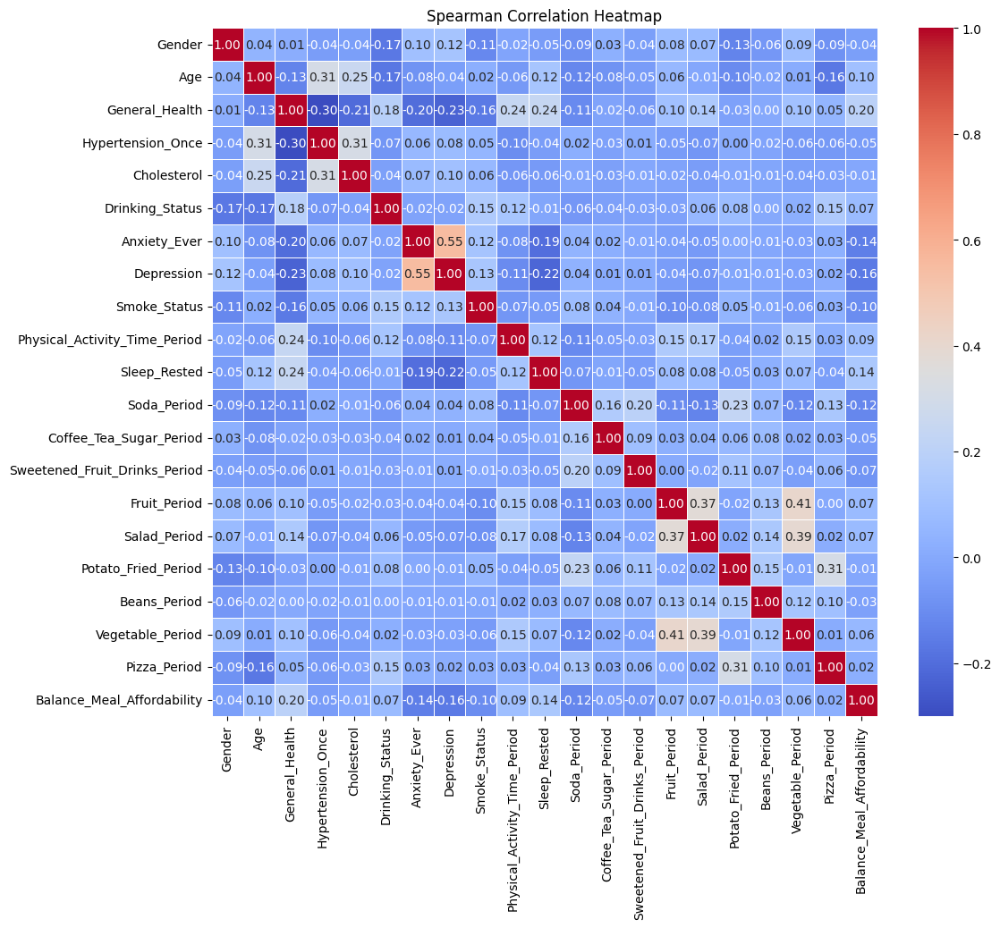

For variable Gender:
Chi-square statistic: 3.6832823430275825
P-value: 0.05496055343499658

For variable Age:
Chi-square statistic: 396.79184277578383
P-value: 7.160239883259487e-57

For variable General_Health:
Chi-square statistic: 1013.005762027926
P-value: 5.420411019940082e-218

For variable Hypertension_Once:
Chi-square statistic: 1047.3182014933593
P-value: 9.315993899270517e-230

For variable Cholesterol:
Chi-square statistic: 965.8028494287383
P-value: 4.871057427469568e-212

For variable Drinking_Status:
Chi-square statistic: 244.11324187158255
P-value: 4.9570490820379035e-49

For variable Anxiety_Ever:
Chi-square statistic: 75.41615471215258
P-value: 3.81257833947751e-18

For variable Depression:
Chi-square statistic: 117.15922661667408
P-value: 2.6492203641792347e-27

For variable Smoke_Status:
Chi-square statistic: 10.228828679246735
P-value: 0.03674455052113099

For variable Physical_Activity_Time_Period:
Chi-square statistic: 148.44273235784112
P-value: 1.651198991169589

In [ ]:
### test Spearman correlation matrix

import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import spearmanr, chi2_contingency

variables_of_interest = ['Gender', 'Age', 'General_Health', 'Hypertension_Once', 'Cholesterol', 'Drinking_Status',
                         'Anxiety_Ever', 'Depression', 'Smoke_Status', 'Physical_Activity_Time_Period',
                         'Sleep_Rested', 'Soda_Period', 'Coffee_Tea_Sugar_Period', 'Sweetened_Fruit_Drinks_Period',
                         'Fruit_Period', 'Salad_Period', 'Potato_Fried_Period', 'Beans_Period', 'Vegetable_Period',
                         'Pizza_Period', 'Balance_Meal_Affordability']

df_subset = df[variables_of_interest]


correlation_matrix_spearman = df_subset.corr(method='spearman')


plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix_spearman, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title("Spearman Correlation Heatmap")
plt.show()


for variable in variables_of_interest:
    cross_tab = pd.crosstab(df['Diabetes_ever_or_borderline'], df[variable])
    chi2, p_value, _, _ = chi2_contingency(cross_tab)
    print(f"For variable {variable}:")
    print(f"Chi-square statistic: {chi2}")
    print(f"P-value: {p_value}\n")

In [ ]:
# Perform Chi-squared test for association between each variable and diabetes status
import pandas as pd
from scipy.stats import spearmanr, chi2_contingency

variables_of_interest = ['Gender', 'Age', 'General_Health', 'Hypertension_Once', 'Cholesterol', 'Drinking_Status',
                         'Anxiety_Ever', 'Depression', 'Smoke_Status', 'Physical_Activity_Time_Period',
                         'Sleep_Rested', 'Soda_Period', 'Coffee_Tea_Sugar_Period', 'Sweetened_Fruit_Drinks_Period',
                         'Fruit_Period', 'Salad_Period', 'Potato_Fried_Period', 'Beans_Period', 'Vegetable_Period',
                         'Pizza_Period', 'Balance_Meal_Affordability']


df_subset = df[variables_of_interest]


correlation_matrix_spearman = df_subset.corr(method='spearman')

print("Spearman Correlation Matrix:")
print(correlation_matrix_spearman)


for variable in variables_of_interest:
    cross_tab = pd.crosstab(df['Diabetes_ever_or_borderline'], df[variable])
    chi2, p_value, _, _ = chi2_contingency(cross_tab)
    print(f"\nChi-squared test for variable '{variable}':")
    print(f"Chi-square statistic: {chi2}")
    print(f"P-value: {p_value}")

Spearman Correlation Matrix:
                                 Gender       Age  General_Health  \
Gender                         1.000000  0.040967        0.014136   
Age                            0.040967  1.000000       -0.131865   
General_Health                 0.014136 -0.131865        1.000000   
Hypertension_Once             -0.042426  0.306910       -0.300952   
Cholesterol                   -0.041760  0.254126       -0.205205   
Drinking_Status               -0.166783 -0.170365        0.181918   
Anxiety_Ever                   0.095528 -0.077829       -0.203228   
Depression                     0.117895 -0.038623       -0.230072   
Smoke_Status                  -0.114539  0.019476       -0.158749   
Physical_Activity_Time_Period -0.020588 -0.057884        0.241911   
Sleep_Rested                  -0.048921  0.122094        0.237946   
Soda_Period                   -0.090884 -0.121912       -0.109564   
Coffee_Tea_Sugar_Period        0.025857 -0.078715       -0.022598   
Sweet

In [ ]:

# Compute Spearman correlation matrix
from scipy.stats import spearmanr

variables_of_interest = ['Gender', 'Age', 'General_Health', 'Hypertension_Once', 'Cholesterol', 'Drinking_Status',
                         'Anxiety_Ever', 'Depression', 'Smoke_Status', 'Physical_Activity_Time_Period',
                         'Sleep_Rested', 'Soda_Period', 'Coffee_Tea_Sugar_Period', 'Sweetened_Fruit_Drinks_Period',
                         'Fruit_Period', 'Salad_Period', 'Potato_Fried_Period', 'Beans_Period', 'Vegetable_Period',
                         'Pizza_Period', 'Balance_Meal_Affordability']


df_subset = df[variables_of_interest]

spearman_corr_matrix = df_subset.corr(method='spearman')


print("Spearman Correlation Matrix:")
print(spearman_corr_matrix)

for var1 in variables_of_interest:
    for var2 in variables_of_interest:
        spearman_corr, p_value = spearmanr(df_subset[var1], df_subset[var2])
        print(f"Spearman correlation between {var1} and {var2}: {spearman_corr}")

Spearman Correlation Matrix:
                                 Gender       Age  General_Health  \
Gender                         1.000000  0.040967        0.014136   
Age                            0.040967  1.000000       -0.131865   
General_Health                 0.014136 -0.131865        1.000000   
Hypertension_Once             -0.042426  0.306910       -0.300952   
Cholesterol                   -0.041760  0.254126       -0.205205   
Drinking_Status               -0.166783 -0.170365        0.181918   
Anxiety_Ever                   0.095528 -0.077829       -0.203228   
Depression                     0.117895 -0.038623       -0.230072   
Smoke_Status                  -0.114539  0.019476       -0.158749   
Physical_Activity_Time_Period -0.020588 -0.057884        0.241911   
Sleep_Rested                  -0.048921  0.122094        0.237946   
Soda_Period                   -0.090884 -0.121912       -0.109564   
Coffee_Tea_Sugar_Period        0.025857 -0.078715       -0.022598   
Sweet

In [ ]:
df_balanced.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28766 entries, 0 to 28765
Data columns (total 23 columns):
 #   Column                         Non-Null Count  Dtype   
---  ------                         --------------  -----   
 0   Gender                         28766 non-null  float64 
 1   Age                            28766 non-null  int64   
 2   General_Health                 28766 non-null  int64   
 3   Hypertension_Once              28766 non-null  float64 
 4   Cholesterol                    28766 non-null  float64 
 5   Drinking_Status                28766 non-null  float64 
 6   Anxiety_Ever                   28766 non-null  float64 
 7   Depression                     28766 non-null  float64 
 8   Smoke_Status                   28766 non-null  float64 
 9   Physical_Activity_Time_Period  28766 non-null  int64   
 10  Sleep_Rested                   28766 non-null  float64 
 11  Soda_Period                    28766 non-null  int64   
 12  Coffee_Tea_Sugar_Period        2

In [ ]:
print(df_balanced)

       Gender  Age  General_Health  Hypertension_Once  Cholesterol  \
0         1.0   85               4                1.0          0.0   
1         2.0   72               4                1.0          0.0   
2         2.0   84               4                1.0          0.0   
3         2.0   42               4                1.0          0.0   
4         1.0   68               5                0.0          1.0   
...       ...  ...             ...                ...          ...   
28761     2.0   85               2                0.0          0.0   
28762     2.0   57               3                1.0          1.0   
28763     2.0   73               3                0.0          1.0   
28764     1.0   65               3                1.0          1.0   
28765     1.0   75               2                0.0          1.0   

       Drinking_Status  Anxiety_Ever  Depression  Smoke_Status  \
0                  3.0           0.0         0.0           1.0   
1                  6.0     

# **Modeling**

In [ ]:
import numpy as np
import pandas as pd
from statsmodels.stats.contingency_tables import Table2x2


table_first_last = pd.crosstab(df['Age_Group'].isin([df['Age_Group'].min(), df['Age_Group'].max()]), df['Diabetes_ever_or_borderline'])

# Perform Cochran-Armitage trend test
test_result = Table2x2(table_first_last.values).test_nominal_association()

print("Cochran-Armitage Trend Test:")
print("P-value:", test_result.pvalue)

Cochran-Armitage Trend Test:
P-value: 0.0


In [ ]:
import pandas as pd
import statsmodels.api as sm
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler



# Define the features (X) and the target variable (y)
X = df_balanced.drop(columns=['Diabetes_ever_or_borderline', 'Age_Group'])
y = df_balanced['Diabetes_ever_or_borderline']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Fit the logistic regression model
logit_model = sm.Logit(y_train, sm.add_constant(X_train_scaled))
result = logit_model.fit()

print(result.summary())

Optimization terminated successfully.
         Current function value: 0.601509
         Iterations 5
                                Logit Regression Results                               
Dep. Variable:     Diabetes_ever_or_borderline   No. Observations:                23012
Model:                                   Logit   Df Residuals:                    22990
Method:                                    MLE   Df Model:                           21
Date:                         Thu, 18 Apr 2024   Pseudo R-squ.:                  0.1322
Time:                                 15:51:45   Log-Likelihood:                -13842.
converged:                                True   LL-Null:                       -15951.
Covariance Type:                     nonrobust   LLR p-value:                     0.000
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0016      0.015    

In [ ]:

feature_names = X.columns.tolist()

x_mapping = {f"x{i+1}": feature_names[i] for i in range(len(feature_names))}

for key, value in x_mapping.items():
    print(f"{key}: {value}")

x1: Gender
x2: Age
x3: General_Health
x4: Hypertension_Once
x5: Cholesterol
x6: Drinking_Status
x7: Anxiety_Ever
x8: Depression
x9: Smoke_Status
x10: Physical_Activity_Time_Period
x11: Sleep_Rested
x12: Soda_Period
x13: Coffee_Tea_Sugar_Period
x14: Sweetened_Fruit_Drinks_Period
x15: Fruit_Period
x16: Salad_Period
x17: Potato_Fried_Period
x18: Beans_Period
x19: Vegetable_Period
x20: Pizza_Period
x21: Balance_Meal_Affordability


In [ ]:
import pandas as pd
import statsmodels.api as sm
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Define the features (X) and the target variable (y), removing 'Age' and 'Gender'
X = df_balanced.drop(columns=['Diabetes_ever_or_borderline', 'Age_Group', 'Age', 'Gender'])
y = df_balanced['Diabetes_ever_or_borderline']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Fit the logistic regression model
logit_model = sm.Logit(y_train, sm.add_constant(X_train_scaled))
result = logit_model.fit()

print(result.summary())

Optimization terminated successfully.
         Current function value: 0.601780
         Iterations 5
                                Logit Regression Results                               
Dep. Variable:     Diabetes_ever_or_borderline   No. Observations:                23012
Model:                                   Logit   Df Residuals:                    22992
Method:                                    MLE   Df Model:                           19
Date:                         Thu, 18 Apr 2024   Pseudo R-squ.:                  0.1318
Time:                                 15:52:48   Log-Likelihood:                -13848.
converged:                                True   LL-Null:                       -15951.
Covariance Type:                     nonrobust   LLR p-value:                     0.000
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0013      0.014    

In [ ]:
# Get the names of the features
feature_names = X.columns.tolist()

x_mapping = {f"x{i+1}": feature_names[i] for i in range(len(feature_names))}

for key, value in x_mapping.items():
    print(f"{key}: {value}")

x1: General_Health
x2: Hypertension_Once
x3: Cholesterol
x4: Drinking_Status
x5: Anxiety_Ever
x6: Depression
x7: Smoke_Status
x8: Physical_Activity_Time_Period
x9: Sleep_Rested
x10: Soda_Period
x11: Coffee_Tea_Sugar_Period
x12: Sweetened_Fruit_Drinks_Period
x13: Fruit_Period
x14: Salad_Period
x15: Potato_Fried_Period
x16: Beans_Period
x17: Vegetable_Period
x18: Pizza_Period
x19: Balance_Meal_Affordability


In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler


X = df[['General_Health', 'Hypertension_Once', 'Cholesterol', 'Physical_Activity_Time_Period', 'Sleep_Rested', 'Soda_Period', 'Sweetened_Fruit_Drinks_Period', 'Pizza_Period']]
y = df['Diabetes_ever_or_borderline']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)


log_reg_model = LogisticRegression()

log_reg_model.fit(X_train_scaled, y_train)


train_accuracy = log_reg_model.score(X_train_scaled, y_train)
test_accuracy = log_reg_model.score(X_test_scaled, y_test)

print("Training Accuracy:", train_accuracy)
print("Testing Accuracy:", test_accuracy)

Training Accuracy: 0.7814271082280642
Testing Accuracy: 0.7916439104314582
